# GANs for Monet Art Generation

We will be discussing about implementing a DCGAN for generating Art in the style of Monet. <br> <br>
GANs reference: https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html
<br>
Dataset: https://www.kaggle.com/competitions/gan-getting-started/data

# Imports

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

import torchvision
import torchvision.transforms as ttf

import os
import os.path as osp
from torchsummary import summary
import gc

from tqdm import tqdm
from PIL import Image
import numpy as np

from functools import partial
import sklearn
import matplotlib.pyplot as plt

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print("Device: ", device)

Device:  cpu


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Kaggle Dataset download

In [ ]:
# TODO: Use the same Kaggle code from HW1P2
!pip install --upgrade --force-reinstall --no-deps kaggle==1.5.8
!mkdir /root/.kaggle/

with open("/root/.kaggle/kaggle.json", "w+") as f:
    f.write('') # Put your kaggle username & key here

!chmod 600 /root/.kaggle/kaggle.json

In [ ]:
!kaggle competitions download -c gan-getting-started

!mkdir data
!unzip -qo 'gan-getting-started.zip' -d '/content/data'

 95% 350M/367M [00:02<00:00, 123MB/s]
100% 367M/367M [00:02<00:00, 129MB/s]


# Helper functions

In [ ]:
def unnormalize(img, mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]):
    for c in range(len(mean)):
        img[:, :, c] = img[:, :, c] * std[c] + mean[c]
    return img

def show_imgs(data, n_imgs= 5):
    fig, ax = plt.subplots(1, n_imgs, figsize= (15, 15))
    for i in range(n_imgs):
        x = data[i].permute(1, 2, 0).cpu().numpy()
        x = unnormalize(x)
        ax[i].imshow(x)
        ax[i].axis('off')
    plt.show()

# Config

In [ ]:
config = {
    'batch_size': 8,
    'img_size': 64,
    'lr': 0.0002,
    'latent_dim': 100,
    'gen_feats': 64,
    'disc_feats': 64
}

# Dataset and Dataloader

In [ ]:
class MonetDataset(Dataset):

    def __init__(self, data_dir, transforms):
        self.data_dir = data_dir
        self.transforms = transforms

        self.img_paths = list(map(lambda fname: osp.join(self.data_dir, fname), sorted(os.listdir(self.data_dir))))
    
    def __len__(self):
        return len(self.img_paths)
    
    def __getitem__(self, idx):
        return self.transforms(Image.open(self.img_paths[idx]))

In [ ]:
transforms = ttf.Compose([ttf.Resize(config['img_size']),
                          ttf.RandomHorizontalFlip(p= 0.5),
                          ttf.RandomVerticalFlip(p= 0.3),
                          ttf.ToTensor(),
                          ttf.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])])

dataset = MonetDataset('/content/data/monet_jpg', transforms)
dataloader = DataLoader(dataset, batch_size= config['batch_size'], shuffle= True)

In [ ]:
print("No. of train images: ", dataset.__len__())
print("Shape of image: ", dataset[0].shape)

No. of train images:  300
Shape of image:  torch.Size([3, 64, 64])


Some training images


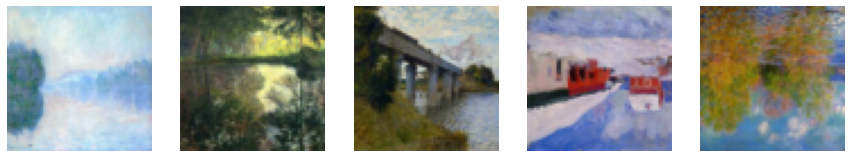

In [ ]:
for data in dataloader:
    print("Some training images")
    show_imgs(data, 5)
    break

# The GAN Model

In [ ]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)

    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [ ]:
class Generator(nn.Module):
    def __init__(self, latent_dim= 100, ngf= 64): # ngf is the number of generator features
        super(Generator, self).__init__()
        self.main = nn.Sequential(

            nn.ConvTranspose2d(latent_dim, ngf * 8, 4, 1, 0, bias=False), # latent vector will be of size 100x1x1
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),

            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),

            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),

            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d(ngf, 3, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

netG = Generator(latent_dim= config['latent_dim'], ngf= config['gen_feats']).to(device)
netG.apply(weights_init)
summary(netG, (100, 1, 1))
del netG

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ConvTranspose2d-1            [-1, 512, 4, 4]         819,200
       BatchNorm2d-2            [-1, 512, 4, 4]           1,024
              ReLU-3            [-1, 512, 4, 4]               0
   ConvTranspose2d-4            [-1, 256, 8, 8]       2,097,152
       BatchNorm2d-5            [-1, 256, 8, 8]             512
              ReLU-6            [-1, 256, 8, 8]               0
   ConvTranspose2d-7          [-1, 128, 16, 16]         524,288
       BatchNorm2d-8          [-1, 128, 16, 16]             256
              ReLU-9          [-1, 128, 16, 16]               0
  ConvTranspose2d-10           [-1, 64, 32, 32]         131,072
      BatchNorm2d-11           [-1, 64, 32, 32]             128
             ReLU-12           [-1, 64, 32, 32]               0
  ConvTranspose2d-13            [-1, 3, 64, 64]           3,072
             Tanh-14            [-1, 3,

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, ndf= 64): # ndf is the number of discriminator features
        super(Discriminator, self).__init__()

        self.main = nn.Sequential(
            # input is 3 x 64 x 64
            nn.Conv2d(3, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),

            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),

            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),

            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

netD = Discriminator(ndf= config['disc_feats']).to(device)
netD.apply(weights_init)
summary(netD, (3, 64, 64))
del netD

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           3,072
         LeakyReLU-2           [-1, 64, 32, 32]               0
            Conv2d-3          [-1, 128, 16, 16]         131,072
       BatchNorm2d-4          [-1, 128, 16, 16]             256
         LeakyReLU-5          [-1, 128, 16, 16]               0
            Conv2d-6            [-1, 256, 8, 8]         524,288
       BatchNorm2d-7            [-1, 256, 8, 8]             512
         LeakyReLU-8            [-1, 256, 8, 8]               0
            Conv2d-9            [-1, 512, 4, 4]       2,097,152
      BatchNorm2d-10            [-1, 512, 4, 4]           1,024
        LeakyReLU-11            [-1, 512, 4, 4]               0
           Conv2d-12              [-1, 1, 1, 1]           8,192
          Sigmoid-13              [-1, 1, 1, 1]               0
Total params: 2,765,568
Trainable param

In [ ]:
class GAN(): # Not a module class. Its just a wrapper class to make this example notebook similar to HW5
    
    def __init__(self, latent_dim, ngf, ndf, device= device):

        self.generator = Generator(latent_dim= latent_dim, ngf= ngf).to(device)
        self.generator.apply(weights_init)

        self.discriminator = Discriminator(ndf= ndf).to(device)
        self.generator.apply(weights_init)

model = GAN(latent_dim= config['latent_dim'], ngf= config['gen_feats'], ndf= config['disc_feats'])
print(model.generator)
print(model.discriminator)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


# Train Configurations

In [ ]:
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, config['latent_dim'], 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizer = {
    'generator': optim.Adam(model.generator.parameters(), lr= config['lr'], betas=(0.5, 0.999)),
    'discriminator': optim.Adam(model.discriminator.parameters(), lr= config['lr'], betas=(0.5, 0.999)),
}

In [ ]:
def discriminator_train_step(model, data):
    
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch


        model.discriminator.zero_grad()
        # Get real data and batch iinfo
        real_data = data.to(device)
        b_size = real_data.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device) # real label = 1 for real data

        # Forward pass real batch through D
        output = model.discriminator(real_data).view(-1)

        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()


        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, config['latent_dim'], 1, 1, device=device) # random noise vector of shape 100x1x1
        # Generate fake image batch with G
        fake = model.generator(noise) # fake image generated by the generator
        label.fill_(fake_label) # label for these images are 0 as they are fake

        # Classify all fake batch with D
        output = model.discriminator(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizer['discriminator'].step()

        return errD.item(), D_x, D_G_z1, fake


In [ ]:
def generator_train_step(model, data, fake):

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        b_size = data.size(0)

        model.generator.zero_grad()
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = model.discriminator(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizer['generator'].step()

        return errG.item(), D_G_z2

# Experiment

Starting Training Loop...

Epoch:  1


LossD: 0.564430 | LossG: 7.521517 | D_x: 0.804269 | DG_z1: 0.199886 | DG_z2: 0.003821


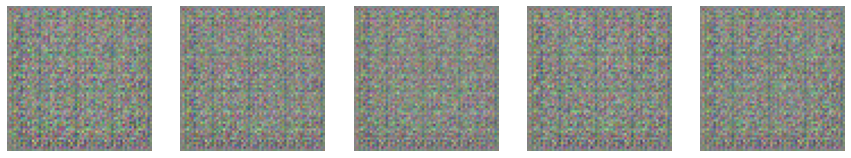


Epoch:  2


LossD: 0.239021 | LossG: 7.688867 | D_x: 0.894689 | DG_z1: 0.082129 | DG_z2: 0.002803

Epoch:  3


LossD: 0.616303 | LossG: 6.755920 | D_x: 0.824926 | DG_z1: 0.157965 | DG_z2: 0.008213

Epoch:  4


LossD: 0.564821 | LossG: 5.113125 | D_x: 0.816706 | DG_z1: 0.190800 | DG_z2: 0.022170

Epoch:  5


LossD: 0.389763 | LossG: 5.543047 | D_x: 0.864101 | DG_z1: 0.133617 | DG_z2: 0.011204

Epoch:  6


LossD: 0.400048 | LossG: 6.925021 | D_x: 0.874641 | DG_z1: 0.123320 | DG_z2: 0.005333

Epoch:  7


LossD: 0.423264 | LossG: 5.805836 | D_x: 0.862997 | DG_z1: 0.134023 | DG_z2: 0.010178

Epoch:  8


LossD: 0.500578 | LossG: 5.436313 | D_x: 0.825243 | DG_z1: 0.145696 | DG_z2: 0.011284

Epoch:  9


LossD: 0.395243 | LossG: 5.260531 | D_x: 0.855301 | DG_z1: 0.122761 | DG_z2: 0.010517

Epoch:  10


LossD: 0.799330 | LossG: 4.688672 | D_x: 0.769478 | DG_z1: 0.230583 | DG_z2: 0.035931

Epoch:  11


LossD: 1.253304 | LossG: 3.020258 | D_x: 0.657373 | DG_z1: 0.365018 | DG_z2: 0.100689


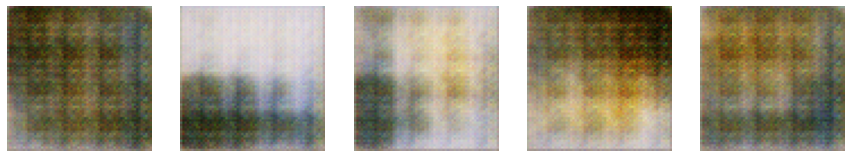


Epoch:  12


LossD: 0.816775 | LossG: 3.772339 | D_x: 0.736749 | DG_z1: 0.264318 | DG_z2: 0.042644

Epoch:  13


LossD: 0.770737 | LossG: 4.831806 | D_x: 0.752675 | DG_z1: 0.238884 | DG_z2: 0.023548

Epoch:  14


LossD: 0.641646 | LossG: 4.555031 | D_x: 0.785456 | DG_z1: 0.208981 | DG_z2: 0.031254

Epoch:  15


LossD: 0.645930 | LossG: 4.279726 | D_x: 0.794534 | DG_z1: 0.222825 | DG_z2: 0.039491

Epoch:  16


LossD: 0.665241 | LossG: 3.961716 | D_x: 0.764722 | DG_z1: 0.213724 | DG_z2: 0.034526

Epoch:  17


LossD: 0.706095 | LossG: 5.134851 | D_x: 0.778702 | DG_z1: 0.219301 | DG_z2: 0.022721

Epoch:  18


LossD: 0.718084 | LossG: 4.579537 | D_x: 0.765249 | DG_z1: 0.217029 | DG_z2: 0.031724

Epoch:  19


LossD: 0.552823 | LossG: 4.833172 | D_x: 0.807300 | DG_z1: 0.189482 | DG_z2: 0.021122

Epoch:  20


LossD: 0.681547 | LossG: 4.578565 | D_x: 0.780214 | DG_z1: 0.216643 | DG_z2: 0.029610

Epoch:  21


LossD: 0.734263 | LossG: 4.068877 | D_x: 0.765416 | DG_z1: 0.218452 | DG_z2: 0.053993


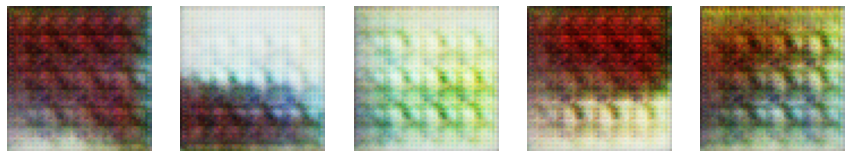


Epoch:  22


LossD: 0.752836 | LossG: 4.164125 | D_x: 0.773179 | DG_z1: 0.225116 | DG_z2: 0.041235

Epoch:  23


LossD: 0.768953 | LossG: 4.024664 | D_x: 0.763179 | DG_z1: 0.254372 | DG_z2: 0.050546

Epoch:  24


LossD: 0.814835 | LossG: 3.240708 | D_x: 0.719322 | DG_z1: 0.277436 | DG_z2: 0.063935

Epoch:  25


LossD: 0.780852 | LossG: 4.107028 | D_x: 0.746977 | DG_z1: 0.254816 | DG_z2: 0.034623

Epoch:  26


LossD: 0.738358 | LossG: 4.051940 | D_x: 0.758983 | DG_z1: 0.222014 | DG_z2: 0.043432

Epoch:  27


LossD: 0.861183 | LossG: 3.513415 | D_x: 0.748426 | DG_z1: 0.273978 | DG_z2: 0.058721

Epoch:  28


LossD: 0.798137 | LossG: 3.437091 | D_x: 0.731054 | DG_z1: 0.254308 | DG_z2: 0.059624

Epoch:  29


LossD: 0.805189 | LossG: 3.496713 | D_x: 0.732240 | DG_z1: 0.258638 | DG_z2: 0.056922

Epoch:  30


LossD: 0.703305 | LossG: 3.452506 | D_x: 0.759102 | DG_z1: 0.245863 | DG_z2: 0.065029

Epoch:  31


LossD: 0.853610 | LossG: 3.551729 | D_x: 0.735896 | DG_z1: 0.265114 | DG_z2: 0.058836


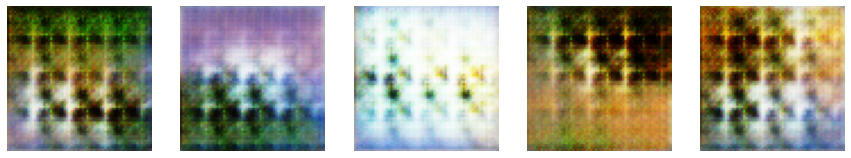


Epoch:  32


LossD: 0.581001 | LossG: 3.649222 | D_x: 0.788156 | DG_z1: 0.203627 | DG_z2: 0.038666

Epoch:  33


LossD: 0.767111 | LossG: 4.001033 | D_x: 0.765006 | DG_z1: 0.236826 | DG_z2: 0.047913

Epoch:  34


LossD: 0.832579 | LossG: 3.789256 | D_x: 0.745848 | DG_z1: 0.267685 | DG_z2: 0.042512

Epoch:  35


LossD: 0.745741 | LossG: 3.328601 | D_x: 0.751332 | DG_z1: 0.244663 | DG_z2: 0.064861

Epoch:  36


LossD: 0.686567 | LossG: 3.799384 | D_x: 0.762737 | DG_z1: 0.225227 | DG_z2: 0.051722

Epoch:  37


LossD: 0.768694 | LossG: 3.588531 | D_x: 0.750956 | DG_z1: 0.244863 | DG_z2: 0.056874

Epoch:  38


LossD: 0.768675 | LossG: 3.691683 | D_x: 0.749948 | DG_z1: 0.261231 | DG_z2: 0.058179

Epoch:  39


LossD: 0.854796 | LossG: 3.485613 | D_x: 0.723094 | DG_z1: 0.270928 | DG_z2: 0.062391

Epoch:  40


LossD: 0.959570 | LossG: 3.865456 | D_x: 0.712602 | DG_z1: 0.291329 | DG_z2: 0.057549

Epoch:  41


LossD: 0.820132 | LossG: 3.454469 | D_x: 0.732239 | DG_z1: 0.264812 | DG_z2: 0.058401


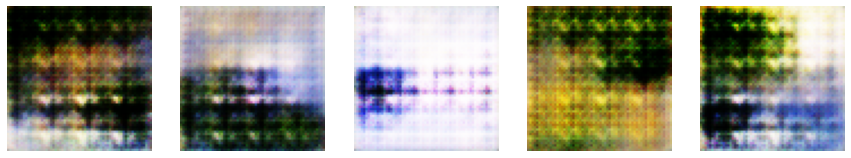


Epoch:  42


LossD: 0.863625 | LossG: 3.800348 | D_x: 0.727547 | DG_z1: 0.276688 | DG_z2: 0.047825

Epoch:  43


LossD: 0.748061 | LossG: 4.212532 | D_x: 0.749861 | DG_z1: 0.238124 | DG_z2: 0.044605

Epoch:  44


LossD: 0.927059 | LossG: 4.326185 | D_x: 0.721342 | DG_z1: 0.274824 | DG_z2: 0.043718

Epoch:  45


LossD: 0.793827 | LossG: 3.740444 | D_x: 0.744013 | DG_z1: 0.246586 | DG_z2: 0.052648

Epoch:  46


LossD: 0.940782 | LossG: 3.582349 | D_x: 0.716291 | DG_z1: 0.285231 | DG_z2: 0.063247

Epoch:  47


LossD: 0.840381 | LossG: 3.564000 | D_x: 0.726480 | DG_z1: 0.281610 | DG_z2: 0.046524

Epoch:  48


LossD: 1.013906 | LossG: 3.563895 | D_x: 0.671444 | DG_z1: 0.309775 | DG_z2: 0.051974

Epoch:  49


LossD: 0.751812 | LossG: 3.557735 | D_x: 0.737900 | DG_z1: 0.260465 | DG_z2: 0.046352

Epoch:  50


LossD: 0.861666 | LossG: 3.493205 | D_x: 0.717185 | DG_z1: 0.276249 | DG_z2: 0.054162

Epoch:  51


LossD: 0.834815 | LossG: 3.540095 | D_x: 0.722905 | DG_z1: 0.272152 | DG_z2: 0.054188


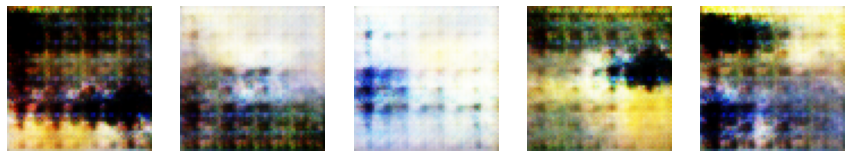


Epoch:  52


LossD: 0.968197 | LossG: 3.287232 | D_x: 0.690692 | DG_z1: 0.294615 | DG_z2: 0.066158

Epoch:  53


LossD: 0.845770 | LossG: 3.400803 | D_x: 0.732696 | DG_z1: 0.274068 | DG_z2: 0.072151

Epoch:  54


LossD: 0.834121 | LossG: 3.497578 | D_x: 0.716187 | DG_z1: 0.284180 | DG_z2: 0.047056

Epoch:  55


LossD: 0.978721 | LossG: 3.230794 | D_x: 0.697000 | DG_z1: 0.284900 | DG_z2: 0.075281

Epoch:  56


LossD: 0.733350 | LossG: 3.244739 | D_x: 0.738836 | DG_z1: 0.263302 | DG_z2: 0.057387

Epoch:  57


LossD: 0.757905 | LossG: 3.617731 | D_x: 0.742667 | DG_z1: 0.249765 | DG_z2: 0.049407

Epoch:  58


LossD: 0.826869 | LossG: 3.549228 | D_x: 0.736858 | DG_z1: 0.263473 | DG_z2: 0.057520

Epoch:  59


LossD: 0.853680 | LossG: 3.682864 | D_x: 0.738544 | DG_z1: 0.254460 | DG_z2: 0.058494

Epoch:  60


LossD: 1.019185 | LossG: 3.266525 | D_x: 0.684092 | DG_z1: 0.325438 | DG_z2: 0.076493

Epoch:  61


LossD: 0.763678 | LossG: 3.382733 | D_x: 0.726539 | DG_z1: 0.260544 | DG_z2: 0.055059


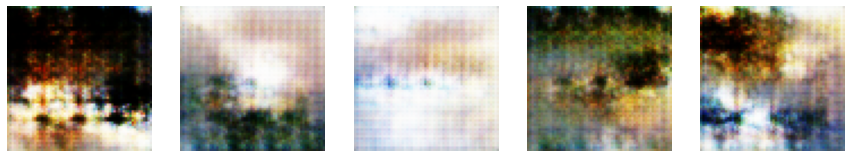


Epoch:  62


LossD: 0.887023 | LossG: 3.302815 | D_x: 0.722089 | DG_z1: 0.277504 | DG_z2: 0.066209

Epoch:  63


LossD: 0.909377 | LossG: 3.324279 | D_x: 0.709230 | DG_z1: 0.284309 | DG_z2: 0.066042

Epoch:  64


LossD: 0.808415 | LossG: 3.486837 | D_x: 0.717578 | DG_z1: 0.277273 | DG_z2: 0.047243

Epoch:  65


LossD: 0.786512 | LossG: 3.309043 | D_x: 0.721915 | DG_z1: 0.269590 | DG_z2: 0.065411

Epoch:  66


LossD: 0.856587 | LossG: 3.352128 | D_x: 0.711869 | DG_z1: 0.285453 | DG_z2: 0.061052

Epoch:  67


LossD: 0.784578 | LossG: 3.618269 | D_x: 0.740391 | DG_z1: 0.263482 | DG_z2: 0.049796

Epoch:  68


LossD: 0.876712 | LossG: 3.384708 | D_x: 0.717852 | DG_z1: 0.276933 | DG_z2: 0.066558

Epoch:  69


LossD: 0.781014 | LossG: 3.383092 | D_x: 0.730364 | DG_z1: 0.263885 | DG_z2: 0.054639

Epoch:  70


LossD: 0.758049 | LossG: 3.301508 | D_x: 0.737785 | DG_z1: 0.253738 | DG_z2: 0.061371

Epoch:  71


LossD: 0.707376 | LossG: 3.708291 | D_x: 0.760965 | DG_z1: 0.236257 | DG_z2: 0.052136


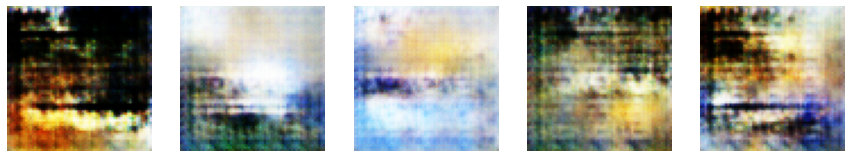


Epoch:  72


LossD: 0.708468 | LossG: 3.795079 | D_x: 0.758197 | DG_z1: 0.235746 | DG_z2: 0.043384

Epoch:  73


LossD: 0.728108 | LossG: 3.627894 | D_x: 0.774504 | DG_z1: 0.237587 | DG_z2: 0.066560

Epoch:  74


LossD: 0.749858 | LossG: 3.638848 | D_x: 0.756448 | DG_z1: 0.240414 | DG_z2: 0.059701

Epoch:  75


LossD: 0.736433 | LossG: 3.596639 | D_x: 0.755362 | DG_z1: 0.235716 | DG_z2: 0.054396

Epoch:  76


LossD: 0.742292 | LossG: 3.641186 | D_x: 0.742581 | DG_z1: 0.247933 | DG_z2: 0.052510

Epoch:  77


LossD: 0.625927 | LossG: 3.716733 | D_x: 0.776994 | DG_z1: 0.216614 | DG_z2: 0.047658

Epoch:  78


LossD: 0.567258 | LossG: 4.176517 | D_x: 0.803911 | DG_z1: 0.207043 | DG_z2: 0.031343

Epoch:  79


LossD: 0.713253 | LossG: 3.907181 | D_x: 0.762046 | DG_z1: 0.214894 | DG_z2: 0.053539

Epoch:  80


LossD: 0.658025 | LossG: 3.681232 | D_x: 0.781844 | DG_z1: 0.217889 | DG_z2: 0.044051

Epoch:  81


LossD: 0.547692 | LossG: 3.822161 | D_x: 0.806055 | DG_z1: 0.197676 | DG_z2: 0.037237


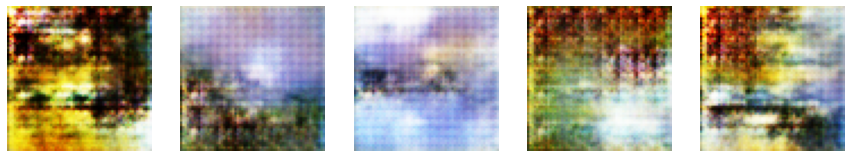


Epoch:  82


LossD: 0.541777 | LossG: 3.942838 | D_x: 0.805915 | DG_z1: 0.189325 | DG_z2: 0.037894

Epoch:  83


LossD: 0.515052 | LossG: 4.140749 | D_x: 0.814529 | DG_z1: 0.189612 | DG_z2: 0.032878

Epoch:  84


LossD: 0.583998 | LossG: 4.181791 | D_x: 0.792909 | DG_z1: 0.186697 | DG_z2: 0.036692

Epoch:  85


LossD: 0.806070 | LossG: 4.468044 | D_x: 0.765849 | DG_z1: 0.250555 | DG_z2: 0.055514

Epoch:  86


LossD: 0.512197 | LossG: 4.096172 | D_x: 0.817947 | DG_z1: 0.170894 | DG_z2: 0.031655

Epoch:  87


LossD: 0.534740 | LossG: 4.559632 | D_x: 0.821816 | DG_z1: 0.179225 | DG_z2: 0.025721

Epoch:  88


LossD: 0.515847 | LossG: 4.327913 | D_x: 0.823098 | DG_z1: 0.171567 | DG_z2: 0.039379

Epoch:  89


LossD: 0.495696 | LossG: 4.297022 | D_x: 0.826569 | DG_z1: 0.169780 | DG_z2: 0.033114

Epoch:  90


LossD: 0.475011 | LossG: 4.429038 | D_x: 0.832400 | DG_z1: 0.171879 | DG_z2: 0.027571

Epoch:  91


LossD: 0.696286 | LossG: 4.589124 | D_x: 0.781203 | DG_z1: 0.206038 | DG_z2: 0.030388


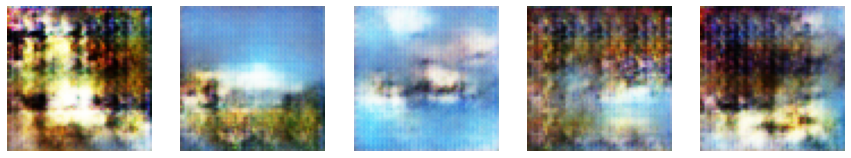


Epoch:  92


LossD: 0.421098 | LossG: 4.412594 | D_x: 0.844785 | DG_z1: 0.157176 | DG_z2: 0.024013

Epoch:  93


LossD: 0.606698 | LossG: 4.855691 | D_x: 0.808447 | DG_z1: 0.190662 | DG_z2: 0.028073

Epoch:  94


LossD: 0.530434 | LossG: 4.323394 | D_x: 0.814540 | DG_z1: 0.177110 | DG_z2: 0.034834

Epoch:  95


LossD: 0.573102 | LossG: 4.862381 | D_x: 0.808660 | DG_z1: 0.195658 | DG_z2: 0.023550

Epoch:  96


LossD: 0.583157 | LossG: 4.534111 | D_x: 0.816032 | DG_z1: 0.185378 | DG_z2: 0.036613

Epoch:  97


LossD: 0.475416 | LossG: 4.420602 | D_x: 0.831801 | DG_z1: 0.157892 | DG_z2: 0.027595

Epoch:  98


LossD: 0.582308 | LossG: 4.597150 | D_x: 0.798669 | DG_z1: 0.190135 | DG_z2: 0.027815

Epoch:  99


LossD: 0.509340 | LossG: 4.085758 | D_x: 0.825128 | DG_z1: 0.188681 | DG_z2: 0.032066

Epoch:  100


LossD: 0.649381 | LossG: 4.289086 | D_x: 0.782998 | DG_z1: 0.207359 | DG_z2: 0.040282

Epoch:  101


LossD: 0.594699 | LossG: 4.230848 | D_x: 0.798428 | DG_z1: 0.195801 | DG_z2: 0.037815


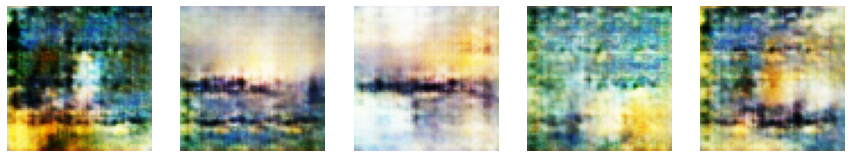


Epoch:  102


LossD: 0.686849 | LossG: 4.408573 | D_x: 0.779394 | DG_z1: 0.220482 | DG_z2: 0.036141

Epoch:  103


LossD: 0.500962 | LossG: 4.228184 | D_x: 0.830020 | DG_z1: 0.176396 | DG_z2: 0.031433

Epoch:  104


LossD: 0.544529 | LossG: 4.481208 | D_x: 0.809772 | DG_z1: 0.188896 | DG_z2: 0.032397

Epoch:  105


LossD: 0.713507 | LossG: 4.397110 | D_x: 0.775491 | DG_z1: 0.217746 | DG_z2: 0.035389

Epoch:  106


LossD: 0.649469 | LossG: 4.066651 | D_x: 0.777765 | DG_z1: 0.202632 | DG_z2: 0.043336

Epoch:  107


LossD: 0.740487 | LossG: 4.369117 | D_x: 0.786601 | DG_z1: 0.231391 | DG_z2: 0.037017

Epoch:  108


LossD: 0.639376 | LossG: 4.174732 | D_x: 0.801236 | DG_z1: 0.204020 | DG_z2: 0.039372

Epoch:  109


LossD: 0.624003 | LossG: 4.153742 | D_x: 0.802009 | DG_z1: 0.195625 | DG_z2: 0.037062

Epoch:  110


LossD: 0.692856 | LossG: 3.728702 | D_x: 0.772520 | DG_z1: 0.217125 | DG_z2: 0.050536

Epoch:  111


LossD: 0.646086 | LossG: 3.638738 | D_x: 0.781369 | DG_z1: 0.216046 | DG_z2: 0.045410


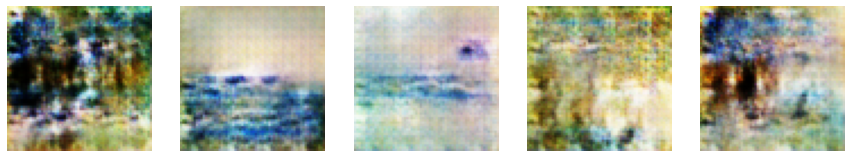


Epoch:  112


LossD: 0.642658 | LossG: 3.804727 | D_x: 0.786494 | DG_z1: 0.217365 | DG_z2: 0.048457

Epoch:  113


LossD: 0.618233 | LossG: 4.197961 | D_x: 0.788801 | DG_z1: 0.205282 | DG_z2: 0.036345

Epoch:  114


LossD: 0.659782 | LossG: 4.047272 | D_x: 0.779944 | DG_z1: 0.226603 | DG_z2: 0.032804

Epoch:  115


LossD: 0.703037 | LossG: 3.749718 | D_x: 0.764510 | DG_z1: 0.215282 | DG_z2: 0.043975

Epoch:  116


LossD: 0.657486 | LossG: 3.934649 | D_x: 0.793775 | DG_z1: 0.215794 | DG_z2: 0.040969

Epoch:  117


LossD: 0.606534 | LossG: 3.844046 | D_x: 0.792613 | DG_z1: 0.206579 | DG_z2: 0.043759

Epoch:  118


LossD: 0.689080 | LossG: 3.891754 | D_x: 0.777659 | DG_z1: 0.226733 | DG_z2: 0.044823

Epoch:  119


LossD: 0.724602 | LossG: 4.075009 | D_x: 0.774297 | DG_z1: 0.226477 | DG_z2: 0.044806

Epoch:  120


LossD: 0.628474 | LossG: 3.717441 | D_x: 0.784157 | DG_z1: 0.213586 | DG_z2: 0.049433

Epoch:  121


LossD: 0.669985 | LossG: 3.600429 | D_x: 0.774535 | DG_z1: 0.208635 | DG_z2: 0.057601


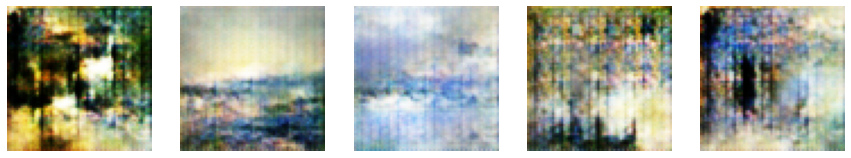


Epoch:  122


LossD: 0.643732 | LossG: 4.036491 | D_x: 0.800337 | DG_z1: 0.211030 | DG_z2: 0.045497

Epoch:  123


LossD: 0.661872 | LossG: 3.695567 | D_x: 0.772167 | DG_z1: 0.216307 | DG_z2: 0.042544

Epoch:  124


LossD: 0.588852 | LossG: 4.021980 | D_x: 0.808565 | DG_z1: 0.202144 | DG_z2: 0.039211

Epoch:  125


LossD: 0.614989 | LossG: 3.994939 | D_x: 0.791765 | DG_z1: 0.203018 | DG_z2: 0.036680

Epoch:  126


LossD: 0.664832 | LossG: 3.693024 | D_x: 0.779615 | DG_z1: 0.203351 | DG_z2: 0.050189

Epoch:  127


LossD: 0.530175 | LossG: 3.838004 | D_x: 0.817285 | DG_z1: 0.192743 | DG_z2: 0.035432

Epoch:  128


LossD: 0.671121 | LossG: 4.390943 | D_x: 0.786581 | DG_z1: 0.213305 | DG_z2: 0.033174

Epoch:  129


LossD: 0.634169 | LossG: 4.298879 | D_x: 0.798074 | DG_z1: 0.213712 | DG_z2: 0.032202

Epoch:  130


LossD: 0.603638 | LossG: 3.991544 | D_x: 0.799036 | DG_z1: 0.188953 | DG_z2: 0.041240

Epoch:  131


LossD: 0.626981 | LossG: 4.136204 | D_x: 0.798595 | DG_z1: 0.207658 | DG_z2: 0.034804


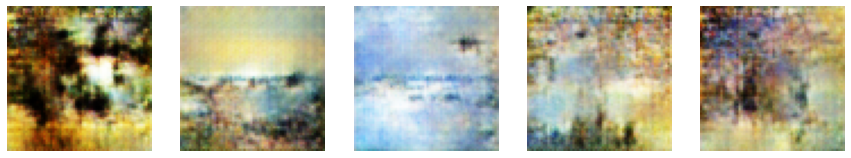


Epoch:  132


LossD: 0.612487 | LossG: 3.833070 | D_x: 0.788910 | DG_z1: 0.188160 | DG_z2: 0.043885

Epoch:  133


LossD: 0.666262 | LossG: 3.954148 | D_x: 0.782859 | DG_z1: 0.215927 | DG_z2: 0.042231

Epoch:  134


LossD: 0.692020 | LossG: 4.119801 | D_x: 0.781003 | DG_z1: 0.228824 | DG_z2: 0.038840

Epoch:  135


LossD: 0.538186 | LossG: 3.836287 | D_x: 0.810121 | DG_z1: 0.194383 | DG_z2: 0.039781

Epoch:  136


LossD: 0.545951 | LossG: 3.800903 | D_x: 0.796800 | DG_z1: 0.188350 | DG_z2: 0.035622

Epoch:  137


LossD: 0.713682 | LossG: 4.167120 | D_x: 0.787487 | DG_z1: 0.218311 | DG_z2: 0.039089

Epoch:  138


LossD: 0.603772 | LossG: 4.041347 | D_x: 0.803538 | DG_z1: 0.198078 | DG_z2: 0.043706

Epoch:  139


LossD: 0.590010 | LossG: 4.127158 | D_x: 0.804018 | DG_z1: 0.200054 | DG_z2: 0.036336

Epoch:  140


LossD: 0.572013 | LossG: 3.936192 | D_x: 0.801602 | DG_z1: 0.199942 | DG_z2: 0.036948

Epoch:  141


LossD: 0.552369 | LossG: 4.041824 | D_x: 0.808538 | DG_z1: 0.182813 | DG_z2: 0.041430


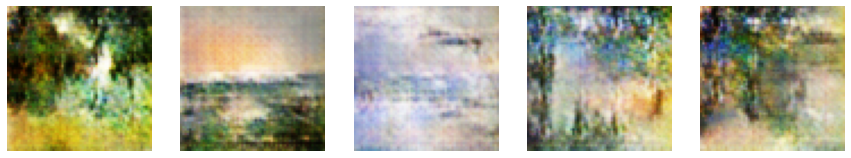


Epoch:  142


LossD: 0.567319 | LossG: 4.137432 | D_x: 0.816164 | DG_z1: 0.182754 | DG_z2: 0.042063

Epoch:  143


LossD: 0.630262 | LossG: 3.974036 | D_x: 0.796343 | DG_z1: 0.202770 | DG_z2: 0.040180

Epoch:  144


LossD: 0.511399 | LossG: 4.049539 | D_x: 0.824474 | DG_z1: 0.176591 | DG_z2: 0.032665

Epoch:  145


LossD: 0.545976 | LossG: 4.066887 | D_x: 0.813885 | DG_z1: 0.185216 | DG_z2: 0.032650

Epoch:  146


LossD: 0.579146 | LossG: 4.096322 | D_x: 0.809851 | DG_z1: 0.173280 | DG_z2: 0.038118

Epoch:  147


LossD: 0.522377 | LossG: 4.107716 | D_x: 0.826862 | DG_z1: 0.184227 | DG_z2: 0.028257

Epoch:  148


LossD: 0.607987 | LossG: 4.369724 | D_x: 0.799063 | DG_z1: 0.200065 | DG_z2: 0.038577

Epoch:  149


LossD: 0.542747 | LossG: 4.405726 | D_x: 0.816963 | DG_z1: 0.179343 | DG_z2: 0.032187

Epoch:  150


LossD: 0.488694 | LossG: 4.145616 | D_x: 0.820770 | DG_z1: 0.172619 | DG_z2: 0.029365

Epoch:  151


LossD: 0.400832 | LossG: 4.101696 | D_x: 0.852944 | DG_z1: 0.156280 | DG_z2: 0.026035


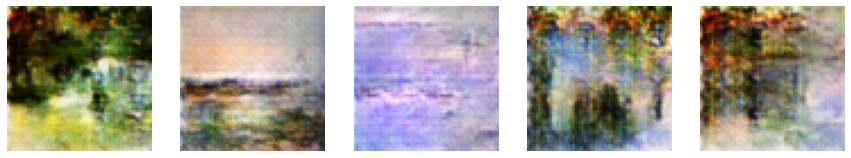


Epoch:  152


LossD: 0.563993 | LossG: 4.315876 | D_x: 0.813560 | DG_z1: 0.175300 | DG_z2: 0.034268

Epoch:  153


LossD: 0.396686 | LossG: 4.517849 | D_x: 0.857003 | DG_z1: 0.145976 | DG_z2: 0.021733

Epoch:  154


LossD: 0.515397 | LossG: 4.687095 | D_x: 0.829213 | DG_z1: 0.175993 | DG_z2: 0.025908

Epoch:  155


LossD: 0.548398 | LossG: 4.231646 | D_x: 0.819251 | DG_z1: 0.175466 | DG_z2: 0.027624

Epoch:  156


LossD: 0.453164 | LossG: 4.367309 | D_x: 0.839237 | DG_z1: 0.155700 | DG_z2: 0.031882

Epoch:  157


LossD: 0.447487 | LossG: 4.234785 | D_x: 0.845336 | DG_z1: 0.159814 | DG_z2: 0.030415

Epoch:  158


LossD: 0.400466 | LossG: 4.395102 | D_x: 0.858324 | DG_z1: 0.152494 | DG_z2: 0.026319

Epoch:  159


LossD: 0.485663 | LossG: 4.618399 | D_x: 0.830691 | DG_z1: 0.156347 | DG_z2: 0.025654

Epoch:  160


LossD: 0.613113 | LossG: 4.649320 | D_x: 0.813437 | DG_z1: 0.191554 | DG_z2: 0.038145

Epoch:  161


LossD: 0.504988 | LossG: 4.469155 | D_x: 0.828003 | DG_z1: 0.161429 | DG_z2: 0.034260


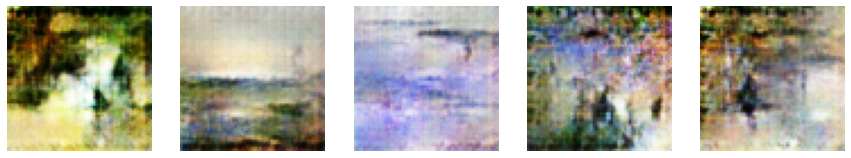


Epoch:  162


LossD: 0.397596 | LossG: 4.623015 | D_x: 0.859115 | DG_z1: 0.142196 | DG_z2: 0.023638

Epoch:  163


LossD: 0.443751 | LossG: 4.799138 | D_x: 0.851998 | DG_z1: 0.153095 | DG_z2: 0.028038

Epoch:  164


LossD: 0.412668 | LossG: 4.427496 | D_x: 0.854043 | DG_z1: 0.142560 | DG_z2: 0.032344

Epoch:  165


LossD: 0.490914 | LossG: 4.618424 | D_x: 0.840474 | DG_z1: 0.156463 | DG_z2: 0.034828

Epoch:  166


LossD: 0.497359 | LossG: 4.588863 | D_x: 0.833981 | DG_z1: 0.152067 | DG_z2: 0.038222

Epoch:  167


LossD: 0.451827 | LossG: 4.769371 | D_x: 0.853669 | DG_z1: 0.154404 | DG_z2: 0.018335

Epoch:  168


LossD: 0.432106 | LossG: 4.332295 | D_x: 0.850765 | DG_z1: 0.146956 | DG_z2: 0.029749

Epoch:  169


LossD: 0.456748 | LossG: 4.686556 | D_x: 0.853192 | DG_z1: 0.149764 | DG_z2: 0.024509

Epoch:  170


LossD: 0.362805 | LossG: 4.468299 | D_x: 0.866644 | DG_z1: 0.132320 | DG_z2: 0.022066

Epoch:  171


LossD: 0.426613 | LossG: 4.817968 | D_x: 0.847993 | DG_z1: 0.135997 | DG_z2: 0.025894


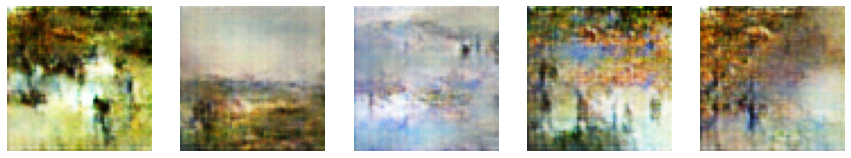


Epoch:  172


LossD: 0.451709 | LossG: 5.016351 | D_x: 0.869007 | DG_z1: 0.148173 | DG_z2: 0.021686

Epoch:  173


LossD: 0.366508 | LossG: 4.668092 | D_x: 0.863620 | DG_z1: 0.135157 | DG_z2: 0.021790

Epoch:  174


LossD: 0.372669 | LossG: 4.546165 | D_x: 0.857504 | DG_z1: 0.126480 | DG_z2: 0.028257

Epoch:  175


LossD: 0.446696 | LossG: 5.041512 | D_x: 0.864691 | DG_z1: 0.151695 | DG_z2: 0.025757

Epoch:  176


LossD: 0.444664 | LossG: 5.042298 | D_x: 0.849497 | DG_z1: 0.145155 | DG_z2: 0.018780

Epoch:  177


LossD: 0.370883 | LossG: 4.667501 | D_x: 0.872164 | DG_z1: 0.121187 | DG_z2: 0.022380

Epoch:  178


LossD: 0.466502 | LossG: 4.975804 | D_x: 0.860098 | DG_z1: 0.153661 | DG_z2: 0.026621

Epoch:  179


LossD: 0.365708 | LossG: 4.764957 | D_x: 0.857548 | DG_z1: 0.127830 | DG_z2: 0.017347

Epoch:  180


LossD: 0.327173 | LossG: 4.784269 | D_x: 0.880932 | DG_z1: 0.125376 | DG_z2: 0.018170

Epoch:  181


LossD: 0.307253 | LossG: 4.830690 | D_x: 0.885025 | DG_z1: 0.112959 | DG_z2: 0.018053


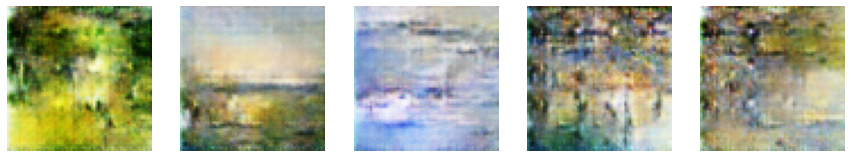


Epoch:  182


LossD: 0.312909 | LossG: 4.939245 | D_x: 0.881487 | DG_z1: 0.116369 | DG_z2: 0.017704

Epoch:  183


LossD: 0.304696 | LossG: 4.895682 | D_x: 0.887750 | DG_z1: 0.104752 | DG_z2: 0.015824

Epoch:  184


LossD: 0.344039 | LossG: 4.969448 | D_x: 0.882222 | DG_z1: 0.125889 | DG_z2: 0.019073

Epoch:  185


LossD: 0.311576 | LossG: 4.809701 | D_x: 0.880545 | DG_z1: 0.107227 | DG_z2: 0.020145

Epoch:  186


LossD: 0.358571 | LossG: 5.258471 | D_x: 0.875713 | DG_z1: 0.137207 | DG_z2: 0.018098

Epoch:  187


LossD: 0.343649 | LossG: 5.003995 | D_x: 0.872902 | DG_z1: 0.122131 | DG_z2: 0.024258

Epoch:  188


LossD: 0.305455 | LossG: 4.919112 | D_x: 0.891471 | DG_z1: 0.110737 | DG_z2: 0.017787

Epoch:  189


LossD: 0.409358 | LossG: 5.052545 | D_x: 0.865479 | DG_z1: 0.125335 | DG_z2: 0.023290

Epoch:  190


LossD: 0.449472 | LossG: 5.406500 | D_x: 0.854556 | DG_z1: 0.141593 | DG_z2: 0.020948

Epoch:  191


LossD: 0.321419 | LossG: 5.085699 | D_x: 0.887371 | DG_z1: 0.115730 | DG_z2: 0.017587


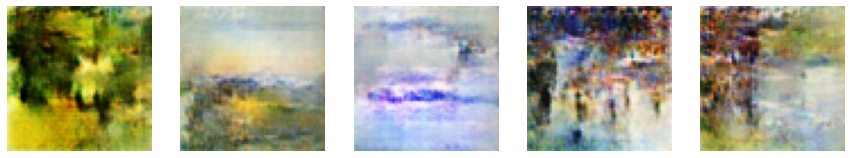


Epoch:  192


LossD: 0.367251 | LossG: 5.157160 | D_x: 0.879814 | DG_z1: 0.124432 | DG_z2: 0.024037

Epoch:  193


LossD: 0.274618 | LossG: 4.991735 | D_x: 0.897652 | DG_z1: 0.099768 | DG_z2: 0.015267

Epoch:  194


LossD: 0.322064 | LossG: 5.133845 | D_x: 0.885624 | DG_z1: 0.115878 | DG_z2: 0.016899

Epoch:  195


LossD: 0.364676 | LossG: 5.141888 | D_x: 0.872824 | DG_z1: 0.118709 | DG_z2: 0.024464

Epoch:  196


LossD: 0.334934 | LossG: 5.374860 | D_x: 0.886024 | DG_z1: 0.119790 | DG_z2: 0.014605

Epoch:  197


LossD: 0.374554 | LossG: 5.206868 | D_x: 0.877610 | DG_z1: 0.119071 | DG_z2: 0.017148

Epoch:  198


LossD: 0.280295 | LossG: 5.185751 | D_x: 0.894053 | DG_z1: 0.101823 | DG_z2: 0.013963

Epoch:  199


LossD: 0.293796 | LossG: 5.172548 | D_x: 0.900292 | DG_z1: 0.100489 | DG_z2: 0.016706

Epoch:  200


LossD: 0.293924 | LossG: 4.888090 | D_x: 0.888575 | DG_z1: 0.106610 | DG_z2: 0.018805

Epoch:  201


LossD: 0.277195 | LossG: 5.178499 | D_x: 0.904405 | DG_z1: 0.099965 | DG_z2: 0.018072


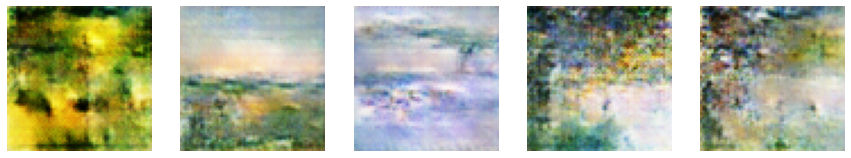


Epoch:  202


LossD: 0.343549 | LossG: 5.364591 | D_x: 0.882816 | DG_z1: 0.114929 | DG_z2: 0.021904

Epoch:  203


LossD: 0.350464 | LossG: 5.352263 | D_x: 0.887868 | DG_z1: 0.116806 | DG_z2: 0.018732

Epoch:  204


LossD: 0.315405 | LossG: 5.197207 | D_x: 0.886260 | DG_z1: 0.105589 | DG_z2: 0.021024

Epoch:  205


LossD: 0.323941 | LossG: 5.449518 | D_x: 0.890705 | DG_z1: 0.110946 | DG_z2: 0.016795

Epoch:  206


LossD: 0.368316 | LossG: 5.133594 | D_x: 0.880018 | DG_z1: 0.111724 | DG_z2: 0.026043

Epoch:  207


LossD: 0.327854 | LossG: 5.523945 | D_x: 0.891604 | DG_z1: 0.115332 | DG_z2: 0.011790

Epoch:  208


LossD: 0.332706 | LossG: 5.399453 | D_x: 0.883134 | DG_z1: 0.113742 | DG_z2: 0.020371

Epoch:  209


LossD: 0.336351 | LossG: 5.390696 | D_x: 0.882368 | DG_z1: 0.114619 | DG_z2: 0.020008

Epoch:  210


LossD: 0.310045 | LossG: 5.374908 | D_x: 0.894346 | DG_z1: 0.107344 | DG_z2: 0.015624

Epoch:  211


LossD: 0.364501 | LossG: 5.477276 | D_x: 0.881412 | DG_z1: 0.108428 | DG_z2: 0.029527


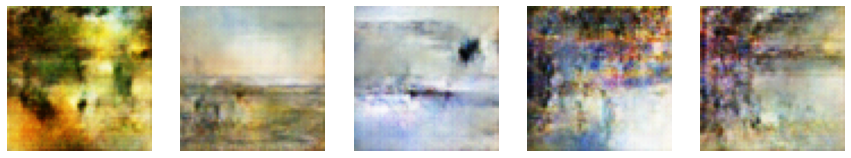


Epoch:  212


LossD: 0.283526 | LossG: 5.298816 | D_x: 0.901712 | DG_z1: 0.102370 | DG_z2: 0.017214

Epoch:  213


LossD: 0.297294 | LossG: 5.235859 | D_x: 0.899800 | DG_z1: 0.102174 | DG_z2: 0.014126

Epoch:  214


LossD: 0.274979 | LossG: 5.173128 | D_x: 0.905338 | DG_z1: 0.094685 | DG_z2: 0.016474

Epoch:  215


LossD: 0.254132 | LossG: 5.092925 | D_x: 0.907953 | DG_z1: 0.089383 | DG_z2: 0.015569

Epoch:  216


LossD: 0.229939 | LossG: 5.449568 | D_x: 0.913373 | DG_z1: 0.087826 | DG_z2: 0.014062

Epoch:  217


LossD: 0.202115 | LossG: 5.304724 | D_x: 0.923006 | DG_z1: 0.076965 | DG_z2: 0.012624

Epoch:  218


LossD: 0.239939 | LossG: 5.505003 | D_x: 0.913737 | DG_z1: 0.087828 | DG_z2: 0.014137

Epoch:  219


LossD: 0.215404 | LossG: 5.118030 | D_x: 0.916429 | DG_z1: 0.079501 | DG_z2: 0.013700

Epoch:  220


LossD: 0.242610 | LossG: 5.482848 | D_x: 0.911456 | DG_z1: 0.091433 | DG_z2: 0.013366

Epoch:  221


LossD: 0.230434 | LossG: 5.491988 | D_x: 0.909142 | DG_z1: 0.082211 | DG_z2: 0.013989


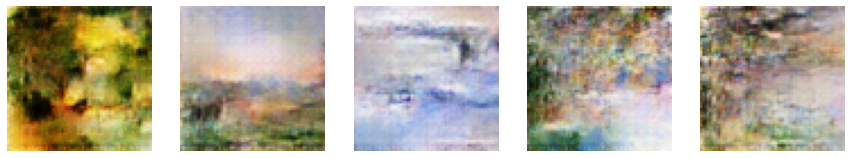


Epoch:  222


LossD: 0.237248 | LossG: 5.388050 | D_x: 0.908786 | DG_z1: 0.078592 | DG_z2: 0.025121

Epoch:  223


LossD: 0.275356 | LossG: 5.651668 | D_x: 0.913374 | DG_z1: 0.098669 | DG_z2: 0.018134

Epoch:  224


LossD: 0.267356 | LossG: 5.994303 | D_x: 0.900634 | DG_z1: 0.098288 | DG_z2: 0.016879

Epoch:  225


LossD: 0.254528 | LossG: 5.752317 | D_x: 0.915114 | DG_z1: 0.090825 | DG_z2: 0.012210

Epoch:  226


LossD: 0.295407 | LossG: 5.875394 | D_x: 0.891006 | DG_z1: 0.093389 | DG_z2: 0.011743

Epoch:  227


LossD: 0.378559 | LossG: 6.106102 | D_x: 0.886363 | DG_z1: 0.120967 | DG_z2: 0.018265

Epoch:  228


LossD: 0.470533 | LossG: 6.224996 | D_x: 0.868810 | DG_z1: 0.137551 | DG_z2: 0.021898

Epoch:  229


LossD: 0.236583 | LossG: 5.410822 | D_x: 0.910090 | DG_z1: 0.087715 | DG_z2: 0.013100

Epoch:  230


LossD: 0.318124 | LossG: 5.827386 | D_x: 0.893232 | DG_z1: 0.105180 | DG_z2: 0.012412

Epoch:  231


LossD: 0.296493 | LossG: 5.389393 | D_x: 0.891417 | DG_z1: 0.097101 | DG_z2: 0.016882


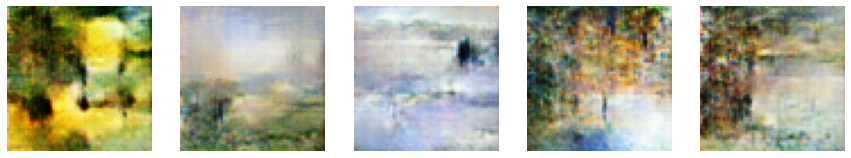


Epoch:  232


LossD: 0.324236 | LossG: 5.709560 | D_x: 0.898600 | DG_z1: 0.107572 | DG_z2: 0.018876

Epoch:  233


LossD: 0.284040 | LossG: 5.740353 | D_x: 0.903910 | DG_z1: 0.091685 | DG_z2: 0.014612

Epoch:  234


LossD: 0.243599 | LossG: 5.567602 | D_x: 0.925917 | DG_z1: 0.080741 | DG_z2: 0.013280

Epoch:  235


LossD: 0.276554 | LossG: 5.917687 | D_x: 0.898888 | DG_z1: 0.095000 | DG_z2: 0.013941

Epoch:  236


LossD: 0.254858 | LossG: 5.611461 | D_x: 0.914254 | DG_z1: 0.086133 | DG_z2: 0.013647

Epoch:  237


LossD: 0.259100 | LossG: 5.986061 | D_x: 0.910118 | DG_z1: 0.091906 | DG_z2: 0.014098

Epoch:  238


LossD: 0.329311 | LossG: 6.050447 | D_x: 0.894642 | DG_z1: 0.103242 | DG_z2: 0.015403

Epoch:  239


LossD: 0.302883 | LossG: 5.614218 | D_x: 0.900310 | DG_z1: 0.099758 | DG_z2: 0.018041

Epoch:  240


LossD: 0.305503 | LossG: 5.818017 | D_x: 0.898535 | DG_z1: 0.098763 | DG_z2: 0.014284

Epoch:  241


LossD: 0.261783 | LossG: 5.916822 | D_x: 0.912317 | DG_z1: 0.086247 | DG_z2: 0.016670


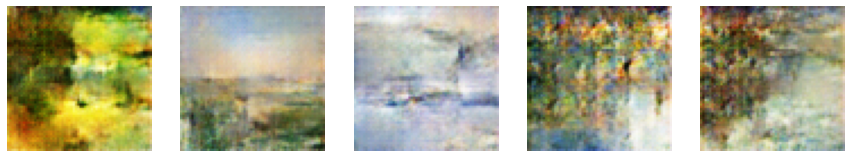


Epoch:  242


LossD: 0.305401 | LossG: 5.947568 | D_x: 0.897991 | DG_z1: 0.101824 | DG_z2: 0.014944

Epoch:  243


LossD: 0.215623 | LossG: 5.431076 | D_x: 0.921373 | DG_z1: 0.082456 | DG_z2: 0.014555

Epoch:  244


LossD: 0.239293 | LossG: 5.586345 | D_x: 0.911559 | DG_z1: 0.081228 | DG_z2: 0.014847

Epoch:  245


LossD: 0.203568 | LossG: 5.864012 | D_x: 0.924219 | DG_z1: 0.080173 | DG_z2: 0.010454

Epoch:  246


LossD: 0.128159 | LossG: 5.429691 | D_x: 0.944881 | DG_z1: 0.052831 | DG_z2: 0.009900

Epoch:  247


LossD: 0.150755 | LossG: 5.541591 | D_x: 0.941718 | DG_z1: 0.057652 | DG_z2: 0.010716

Epoch:  248


LossD: 0.213772 | LossG: 6.019127 | D_x: 0.923275 | DG_z1: 0.077031 | DG_z2: 0.015618

Epoch:  249


LossD: 0.183616 | LossG: 5.805682 | D_x: 0.931550 | DG_z1: 0.066123 | DG_z2: 0.009168

Epoch:  250


LossD: 0.216117 | LossG: 5.836770 | D_x: 0.929885 | DG_z1: 0.076264 | DG_z2: 0.013937

Epoch:  251


LossD: 0.255754 | LossG: 6.111264 | D_x: 0.913361 | DG_z1: 0.083594 | DG_z2: 0.014879


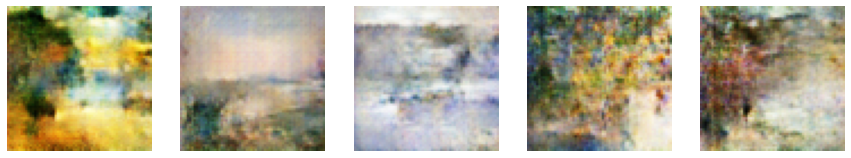


Epoch:  252


LossD: 0.139881 | LossG: 5.543379 | D_x: 0.942005 | DG_z1: 0.055594 | DG_z2: 0.009573

Epoch:  253


LossD: 0.160748 | LossG: 6.230769 | D_x: 0.937976 | DG_z1: 0.060927 | DG_z2: 0.008556

Epoch:  254


LossD: 0.185549 | LossG: 5.745699 | D_x: 0.930717 | DG_z1: 0.062679 | DG_z2: 0.012510

Epoch:  255


LossD: 0.173451 | LossG: 5.866653 | D_x: 0.938530 | DG_z1: 0.063347 | DG_z2: 0.010669

Epoch:  256


LossD: 0.277330 | LossG: 5.757652 | D_x: 0.912747 | DG_z1: 0.096466 | DG_z2: 0.027507

Epoch:  257


LossD: 0.261493 | LossG: 6.357307 | D_x: 0.916019 | DG_z1: 0.082626 | DG_z2: 0.012610

Epoch:  258


LossD: 0.247286 | LossG: 6.013607 | D_x: 0.916620 | DG_z1: 0.080647 | DG_z2: 0.013610

Epoch:  259


LossD: 0.164203 | LossG: 5.471339 | D_x: 0.934616 | DG_z1: 0.060805 | DG_z2: 0.013164

Epoch:  260


LossD: 0.168504 | LossG: 5.936219 | D_x: 0.936302 | DG_z1: 0.063760 | DG_z2: 0.008778

Epoch:  261


LossD: 0.161264 | LossG: 6.400336 | D_x: 0.939308 | DG_z1: 0.060725 | DG_z2: 0.007678


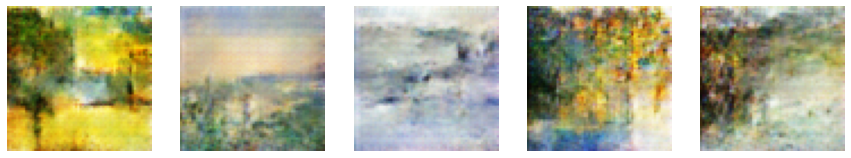


Epoch:  262


LossD: 0.249783 | LossG: 6.821936 | D_x: 0.921882 | DG_z1: 0.074861 | DG_z2: 0.008717

Epoch:  263


LossD: 0.180044 | LossG: 6.141080 | D_x: 0.938298 | DG_z1: 0.074885 | DG_z2: 0.009867

Epoch:  264


LossD: 0.280324 | LossG: 6.415365 | D_x: 0.907137 | DG_z1: 0.077417 | DG_z2: 0.021360

Epoch:  265


LossD: 0.238299 | LossG: 6.555932 | D_x: 0.926391 | DG_z1: 0.077873 | DG_z2: 0.008256

Epoch:  266


LossD: 0.400380 | LossG: 6.993428 | D_x: 0.885763 | DG_z1: 0.107393 | DG_z2: 0.013675

Epoch:  267


LossD: 0.317578 | LossG: 6.362873 | D_x: 0.910027 | DG_z1: 0.101719 | DG_z2: 0.016371

Epoch:  268


LossD: 0.202213 | LossG: 5.954793 | D_x: 0.921628 | DG_z1: 0.070573 | DG_z2: 0.010851

Epoch:  269


LossD: 0.162139 | LossG: 5.742623 | D_x: 0.935447 | DG_z1: 0.060105 | DG_z2: 0.008455

Epoch:  270


LossD: 0.136670 | LossG: 6.048717 | D_x: 0.949786 | DG_z1: 0.054808 | DG_z2: 0.009076

Epoch:  271


LossD: 0.178957 | LossG: 5.864641 | D_x: 0.937821 | DG_z1: 0.056350 | DG_z2: 0.011445


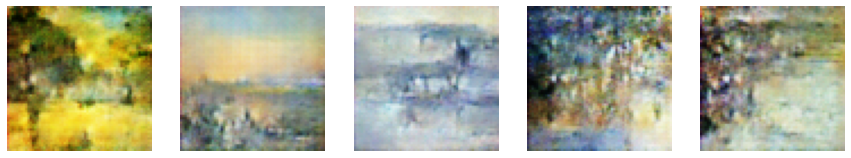


Epoch:  272


LossD: 0.251594 | LossG: 6.646431 | D_x: 0.923100 | DG_z1: 0.078436 | DG_z2: 0.014821

Epoch:  273


LossD: 0.163706 | LossG: 6.171106 | D_x: 0.938977 | DG_z1: 0.063451 | DG_z2: 0.008009

Epoch:  274


LossD: 0.121145 | LossG: 5.626038 | D_x: 0.945939 | DG_z1: 0.049256 | DG_z2: 0.009115

Epoch:  275


LossD: 0.149589 | LossG: 6.198651 | D_x: 0.945376 | DG_z1: 0.054663 | DG_z2: 0.008362

Epoch:  276


LossD: 0.128538 | LossG: 5.907322 | D_x: 0.947947 | DG_z1: 0.052269 | DG_z2: 0.009515

Epoch:  277


LossD: 0.126207 | LossG: 5.972894 | D_x: 0.950046 | DG_z1: 0.050458 | DG_z2: 0.007666

Epoch:  278


LossD: 0.154200 | LossG: 6.107733 | D_x: 0.941654 | DG_z1: 0.054819 | DG_z2: 0.008298

Epoch:  279


LossD: 0.191786 | LossG: 6.315618 | D_x: 0.928182 | DG_z1: 0.070811 | DG_z2: 0.010672

Epoch:  280


LossD: 0.181003 | LossG: 6.214741 | D_x: 0.942686 | DG_z1: 0.060475 | DG_z2: 0.020048

Epoch:  281


LossD: 0.277285 | LossG: 6.774543 | D_x: 0.913554 | DG_z1: 0.083513 | DG_z2: 0.009472


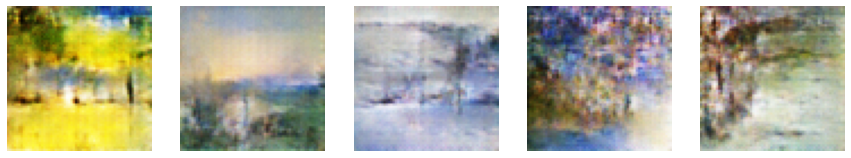


Epoch:  282


LossD: 0.199303 | LossG: 6.235987 | D_x: 0.927121 | DG_z1: 0.066540 | DG_z2: 0.008569

Epoch:  283


LossD: 0.172035 | LossG: 5.889095 | D_x: 0.942870 | DG_z1: 0.062753 | DG_z2: 0.009959

Epoch:  284


LossD: 0.190750 | LossG: 6.354524 | D_x: 0.931316 | DG_z1: 0.069148 | DG_z2: 0.011147

Epoch:  285


LossD: 0.204078 | LossG: 6.445388 | D_x: 0.935142 | DG_z1: 0.066750 | DG_z2: 0.013276

Epoch:  286


LossD: 0.307476 | LossG: 7.079357 | D_x: 0.904431 | DG_z1: 0.084568 | DG_z2: 0.019740

Epoch:  287


LossD: 0.240037 | LossG: 6.590414 | D_x: 0.923234 | DG_z1: 0.084370 | DG_z2: 0.008036

Epoch:  288


LossD: 0.252436 | LossG: 6.812147 | D_x: 0.919085 | DG_z1: 0.085994 | DG_z2: 0.009627

Epoch:  289


LossD: 0.288440 | LossG: 6.734426 | D_x: 0.909935 | DG_z1: 0.077820 | DG_z2: 0.014323

Epoch:  290


LossD: 0.252252 | LossG: 6.858573 | D_x: 0.924409 | DG_z1: 0.083229 | DG_z2: 0.011855

Epoch:  291


LossD: 0.180260 | LossG: 6.134028 | D_x: 0.931973 | DG_z1: 0.064797 | DG_z2: 0.007749


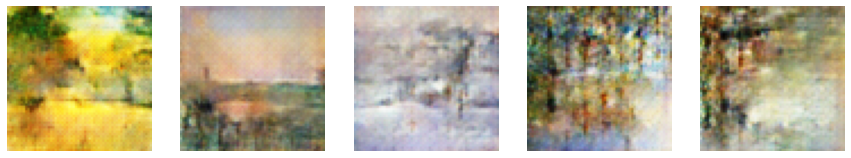


Epoch:  292


LossD: 0.149844 | LossG: 6.382067 | D_x: 0.938462 | DG_z1: 0.053806 | DG_z2: 0.006586

Epoch:  293


LossD: 0.133603 | LossG: 5.462959 | D_x: 0.946322 | DG_z1: 0.054409 | DG_z2: 0.009436

Epoch:  294


LossD: 0.156133 | LossG: 6.165445 | D_x: 0.945056 | DG_z1: 0.060404 | DG_z2: 0.008979

Epoch:  295


LossD: 0.130073 | LossG: 6.501171 | D_x: 0.952154 | DG_z1: 0.050044 | DG_z2: 0.006154

Epoch:  296


LossD: 0.112392 | LossG: 6.232550 | D_x: 0.953758 | DG_z1: 0.043799 | DG_z2: 0.007633

Epoch:  297


LossD: 0.121740 | LossG: 6.035220 | D_x: 0.954911 | DG_z1: 0.048898 | DG_z2: 0.008370

Epoch:  298


LossD: 0.111855 | LossG: 6.037867 | D_x: 0.952643 | DG_z1: 0.040633 | DG_z2: 0.012658

Epoch:  299


LossD: 0.119123 | LossG: 6.336110 | D_x: 0.952003 | DG_z1: 0.042873 | DG_z2: 0.007215

Epoch:  300


LossD: 0.178179 | LossG: 7.382179 | D_x: 0.940037 | DG_z1: 0.064333 | DG_z2: 0.006008

Epoch:  301


LossD: 0.133461 | LossG: 6.744075 | D_x: 0.949419 | DG_z1: 0.051931 | DG_z2: 0.006814


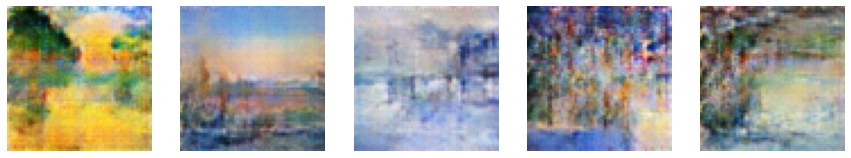


Epoch:  302


LossD: 0.187532 | LossG: 6.612744 | D_x: 0.940783 | DG_z1: 0.053148 | DG_z2: 0.008702

Epoch:  303


LossD: 0.225723 | LossG: 6.784975 | D_x: 0.927216 | DG_z1: 0.075288 | DG_z2: 0.009743

Epoch:  304


LossD: 0.169039 | LossG: 6.414725 | D_x: 0.941761 | DG_z1: 0.059837 | DG_z2: 0.008307

Epoch:  305


LossD: 0.132836 | LossG: 6.493413 | D_x: 0.951081 | DG_z1: 0.050472 | DG_z2: 0.008594

Epoch:  306


LossD: 0.149517 | LossG: 6.924083 | D_x: 0.944391 | DG_z1: 0.055113 | DG_z2: 0.006247

Epoch:  307


LossD: 0.199118 | LossG: 6.513245 | D_x: 0.935158 | DG_z1: 0.062767 | DG_z2: 0.009085

Epoch:  308


LossD: 0.191621 | LossG: 6.807695 | D_x: 0.929602 | DG_z1: 0.062781 | DG_z2: 0.010165

Epoch:  309


LossD: 0.284735 | LossG: 7.283276 | D_x: 0.918185 | DG_z1: 0.092310 | DG_z2: 0.022932

Epoch:  310


LossD: 0.198458 | LossG: 6.633729 | D_x: 0.930711 | DG_z1: 0.063444 | DG_z2: 0.008644

Epoch:  311


LossD: 0.238313 | LossG: 6.764419 | D_x: 0.924349 | DG_z1: 0.076545 | DG_z2: 0.020167


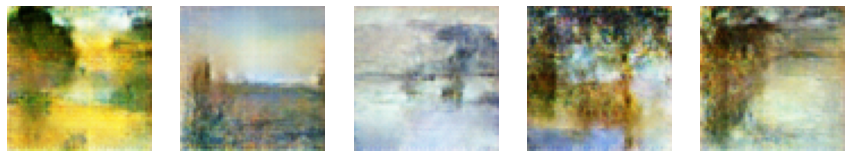


Epoch:  312


LossD: 0.190151 | LossG: 6.728690 | D_x: 0.929296 | DG_z1: 0.070235 | DG_z2: 0.008934

Epoch:  313


LossD: 0.141962 | LossG: 6.038172 | D_x: 0.947157 | DG_z1: 0.054479 | DG_z2: 0.008316

Epoch:  314


LossD: 0.179750 | LossG: 6.431833 | D_x: 0.935124 | DG_z1: 0.061449 | DG_z2: 0.006300

Epoch:  315


LossD: 0.189499 | LossG: 6.427995 | D_x: 0.934136 | DG_z1: 0.062621 | DG_z2: 0.010561

Epoch:  316


LossD: 0.178409 | LossG: 6.476298 | D_x: 0.940358 | DG_z1: 0.068059 | DG_z2: 0.009288

Epoch:  317


LossD: 0.202718 | LossG: 6.702509 | D_x: 0.932242 | DG_z1: 0.062859 | DG_z2: 0.009159

Epoch:  318


LossD: 0.182778 | LossG: 6.387272 | D_x: 0.933099 | DG_z1: 0.059726 | DG_z2: 0.010995

Epoch:  319


LossD: 0.130128 | LossG: 6.088098 | D_x: 0.953026 | DG_z1: 0.052212 | DG_z2: 0.007262

Epoch:  320


LossD: 0.107927 | LossG: 6.077134 | D_x: 0.956502 | DG_z1: 0.043447 | DG_z2: 0.006727

Epoch:  321


LossD: 0.114348 | LossG: 6.011619 | D_x: 0.950446 | DG_z1: 0.043572 | DG_z2: 0.007676


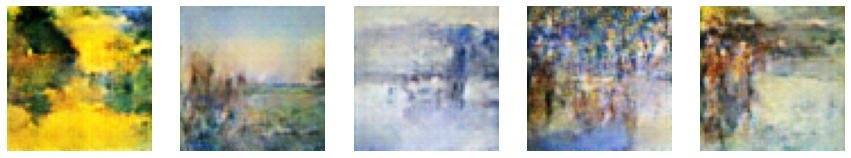


Epoch:  322


LossD: 0.098458 | LossG: 6.286165 | D_x: 0.963745 | DG_z1: 0.040911 | DG_z2: 0.006384

Epoch:  323


LossD: 0.118328 | LossG: 6.381946 | D_x: 0.956139 | DG_z1: 0.042906 | DG_z2: 0.005977

Epoch:  324


LossD: 0.149414 | LossG: 6.563602 | D_x: 0.952720 | DG_z1: 0.049275 | DG_z2: 0.010884

Epoch:  325


LossD: 0.133266 | LossG: 6.726059 | D_x: 0.951064 | DG_z1: 0.046398 | DG_z2: 0.007638

Epoch:  326


LossD: 0.137735 | LossG: 6.849906 | D_x: 0.949493 | DG_z1: 0.047745 | DG_z2: 0.007105

Epoch:  327


LossD: 0.161967 | LossG: 6.846965 | D_x: 0.946012 | DG_z1: 0.056669 | DG_z2: 0.007841

Epoch:  328


LossD: 0.197324 | LossG: 6.977982 | D_x: 0.930528 | DG_z1: 0.062170 | DG_z2: 0.009103

Epoch:  329


LossD: 0.171067 | LossG: 6.765080 | D_x: 0.943266 | DG_z1: 0.063943 | DG_z2: 0.012457

Epoch:  330


LossD: 0.118897 | LossG: 6.776146 | D_x: 0.954250 | DG_z1: 0.047431 | DG_z2: 0.006572

Epoch:  331


LossD: 0.220801 | LossG: 7.367035 | D_x: 0.931024 | DG_z1: 0.064306 | DG_z2: 0.008302


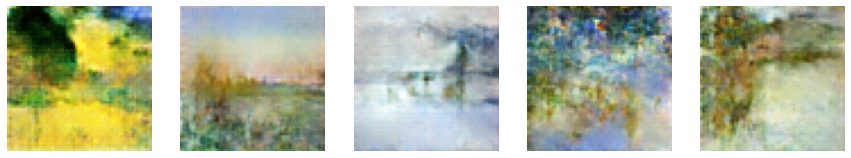


Epoch:  332


LossD: 0.228202 | LossG: 7.308522 | D_x: 0.930575 | DG_z1: 0.075779 | DG_z2: 0.006225

Epoch:  333


LossD: 0.185847 | LossG: 6.872085 | D_x: 0.936110 | DG_z1: 0.062709 | DG_z2: 0.007442

Epoch:  334


LossD: 0.160240 | LossG: 6.272580 | D_x: 0.940829 | DG_z1: 0.054342 | DG_z2: 0.010042

Epoch:  335


LossD: 0.100249 | LossG: 6.223737 | D_x: 0.959832 | DG_z1: 0.042785 | DG_z2: 0.005982

Epoch:  336


LossD: 0.108153 | LossG: 6.262676 | D_x: 0.958508 | DG_z1: 0.039655 | DG_z2: 0.007615

Epoch:  337


LossD: 0.074079 | LossG: 6.342315 | D_x: 0.969700 | DG_z1: 0.034072 | DG_z2: 0.005078

Epoch:  338


LossD: 0.078577 | LossG: 6.409761 | D_x: 0.965888 | DG_z1: 0.030662 | DG_z2: 0.006533

Epoch:  339


LossD: 0.135743 | LossG: 6.486466 | D_x: 0.955502 | DG_z1: 0.045320 | DG_z2: 0.009654

Epoch:  340


LossD: 0.113299 | LossG: 6.541669 | D_x: 0.959034 | DG_z1: 0.044277 | DG_z2: 0.010844

Epoch:  341


LossD: 0.134527 | LossG: 6.670174 | D_x: 0.948657 | DG_z1: 0.047057 | DG_z2: 0.007686


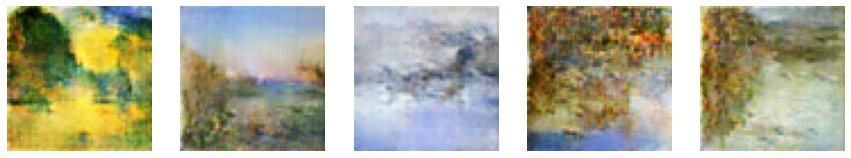


Epoch:  342


LossD: 0.123769 | LossG: 6.787960 | D_x: 0.952708 | DG_z1: 0.042760 | DG_z2: 0.007163

Epoch:  343


LossD: 0.135763 | LossG: 6.793068 | D_x: 0.953549 | DG_z1: 0.047410 | DG_z2: 0.004030

Epoch:  344


LossD: 0.103781 | LossG: 6.736531 | D_x: 0.958947 | DG_z1: 0.042007 | DG_z2: 0.005231

Epoch:  345


LossD: 0.099328 | LossG: 6.764804 | D_x: 0.959140 | DG_z1: 0.040905 | DG_z2: 0.005272

Epoch:  346


LossD: 0.078178 | LossG: 6.721799 | D_x: 0.967430 | DG_z1: 0.032776 | DG_z2: 0.004758

Epoch:  347


LossD: 0.095610 | LossG: 6.510353 | D_x: 0.963016 | DG_z1: 0.036655 | DG_z2: 0.005449

Epoch:  348


LossD: 0.109502 | LossG: 7.110275 | D_x: 0.959671 | DG_z1: 0.042787 | DG_z2: 0.005098

Epoch:  349


LossD: 0.083812 | LossG: 6.926518 | D_x: 0.964464 | DG_z1: 0.031812 | DG_z2: 0.005964

Epoch:  350


LossD: 0.110477 | LossG: 7.105759 | D_x: 0.958828 | DG_z1: 0.039860 | DG_z2: 0.006395

Epoch:  351


LossD: 0.093708 | LossG: 6.439076 | D_x: 0.963253 | DG_z1: 0.033700 | DG_z2: 0.005602


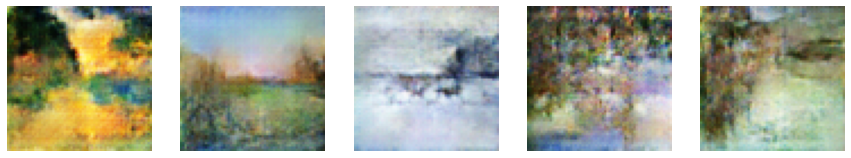


Epoch:  352


LossD: 0.095949 | LossG: 7.084429 | D_x: 0.966283 | DG_z1: 0.037126 | DG_z2: 0.004887

Epoch:  353


LossD: 0.075105 | LossG: 6.871595 | D_x: 0.966268 | DG_z1: 0.026920 | DG_z2: 0.007384

Epoch:  354


LossD: 0.179191 | LossG: 8.166776 | D_x: 0.937762 | DG_z1: 0.055161 | DG_z2: 0.009144

Epoch:  355


LossD: 0.397728 | LossG: 8.761377 | D_x: 0.905733 | DG_z1: 0.104154 | DG_z2: 0.025898

Epoch:  356


LossD: 0.372022 | LossG: 8.258365 | D_x: 0.899808 | DG_z1: 0.104324 | DG_z2: 0.010823

Epoch:  357


LossD: 0.197582 | LossG: 6.817939 | D_x: 0.930226 | DG_z1: 0.067737 | DG_z2: 0.006776

Epoch:  358


LossD: 0.408144 | LossG: 7.421219 | D_x: 0.896980 | DG_z1: 0.094925 | DG_z2: 0.029386

Epoch:  359


LossD: 0.284631 | LossG: 7.138402 | D_x: 0.922077 | DG_z1: 0.082522 | DG_z2: 0.006072

Epoch:  360


LossD: 0.202063 | LossG: 6.488603 | D_x: 0.926023 | DG_z1: 0.068281 | DG_z2: 0.010113

Epoch:  361


LossD: 0.224093 | LossG: 7.484378 | D_x: 0.939445 | DG_z1: 0.070788 | DG_z2: 0.006031


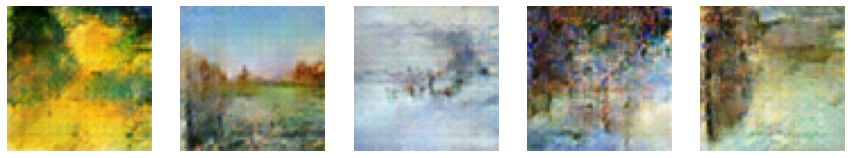


Epoch:  362


LossD: 0.193048 | LossG: 7.069459 | D_x: 0.935104 | DG_z1: 0.066746 | DG_z2: 0.008008

Epoch:  363


LossD: 0.124594 | LossG: 6.535493 | D_x: 0.951606 | DG_z1: 0.047993 | DG_z2: 0.005925

Epoch:  364


LossD: 0.102836 | LossG: 6.193697 | D_x: 0.959804 | DG_z1: 0.040730 | DG_z2: 0.006375

Epoch:  365


LossD: 0.091314 | LossG: 5.897809 | D_x: 0.961066 | DG_z1: 0.040995 | DG_z2: 0.006916

Epoch:  366


LossD: 0.089522 | LossG: 6.567154 | D_x: 0.961669 | DG_z1: 0.034518 | DG_z2: 0.006071

Epoch:  367


LossD: 0.067863 | LossG: 6.265652 | D_x: 0.970303 | DG_z1: 0.029142 | DG_z2: 0.005242

Epoch:  368


LossD: 0.077626 | LossG: 6.183930 | D_x: 0.964425 | DG_z1: 0.030330 | DG_z2: 0.006325

Epoch:  369


LossD: 0.074230 | LossG: 6.739561 | D_x: 0.972728 | DG_z1: 0.035979 | DG_z2: 0.006236

Epoch:  370


LossD: 0.104680 | LossG: 6.688505 | D_x: 0.958298 | DG_z1: 0.036316 | DG_z2: 0.007215

Epoch:  371


LossD: 0.069913 | LossG: 6.253467 | D_x: 0.967875 | DG_z1: 0.029042 | DG_z2: 0.005454


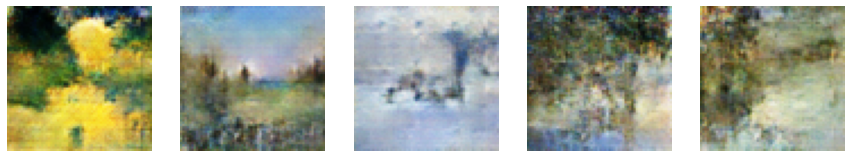


Epoch:  372


LossD: 0.097198 | LossG: 6.507177 | D_x: 0.964419 | DG_z1: 0.039229 | DG_z2: 0.006376

Epoch:  373


LossD: 0.062818 | LossG: 6.570005 | D_x: 0.972153 | DG_z1: 0.026463 | DG_z2: 0.005495

Epoch:  374


LossD: 0.146747 | LossG: 7.464984 | D_x: 0.949736 | DG_z1: 0.048436 | DG_z2: 0.005329

Epoch:  375


LossD: 0.080199 | LossG: 6.903530 | D_x: 0.967392 | DG_z1: 0.033085 | DG_z2: 0.005288

Epoch:  376


LossD: 0.094039 | LossG: 7.112857 | D_x: 0.965875 | DG_z1: 0.035829 | DG_z2: 0.004342

Epoch:  377


LossD: 0.085898 | LossG: 6.627495 | D_x: 0.965548 | DG_z1: 0.031241 | DG_z2: 0.006512

Epoch:  378


LossD: 0.174176 | LossG: 8.479145 | D_x: 0.942570 | DG_z1: 0.054847 | DG_z2: 0.010593

Epoch:  379


LossD: 0.237451 | LossG: 8.421846 | D_x: 0.931058 | DG_z1: 0.069304 | DG_z2: 0.011382

Epoch:  380


LossD: 0.276204 | LossG: 8.149140 | D_x: 0.929503 | DG_z1: 0.074763 | DG_z2: 0.008812

Epoch:  381


LossD: 0.180231 | LossG: 6.837101 | D_x: 0.932936 | DG_z1: 0.057429 | DG_z2: 0.006852


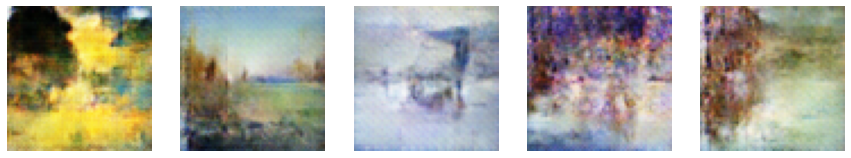


Epoch:  382


LossD: 0.230072 | LossG: 7.598504 | D_x: 0.943095 | DG_z1: 0.069343 | DG_z2: 0.005329

Epoch:  383


LossD: 0.147072 | LossG: 6.590194 | D_x: 0.940506 | DG_z1: 0.052613 | DG_z2: 0.007266

Epoch:  384


LossD: 0.100122 | LossG: 6.540092 | D_x: 0.960654 | DG_z1: 0.043198 | DG_z2: 0.005910

Epoch:  385


LossD: 0.110780 | LossG: 6.677260 | D_x: 0.958776 | DG_z1: 0.040082 | DG_z2: 0.006928

Epoch:  386


LossD: 0.084603 | LossG: 6.598865 | D_x: 0.965744 | DG_z1: 0.035764 | DG_z2: 0.005341

Epoch:  387


LossD: 0.071759 | LossG: 6.299305 | D_x: 0.968736 | DG_z1: 0.031399 | DG_z2: 0.005377

Epoch:  388


LossD: 0.060923 | LossG: 6.649036 | D_x: 0.973839 | DG_z1: 0.025360 | DG_z2: 0.004875

Epoch:  389


LossD: 0.052869 | LossG: 6.559077 | D_x: 0.977185 | DG_z1: 0.024814 | DG_z2: 0.004068

Epoch:  390


LossD: 0.061788 | LossG: 6.819803 | D_x: 0.971629 | DG_z1: 0.023500 | DG_z2: 0.004070

Epoch:  391


LossD: 0.058033 | LossG: 7.070034 | D_x: 0.978027 | DG_z1: 0.026025 | DG_z2: 0.003722


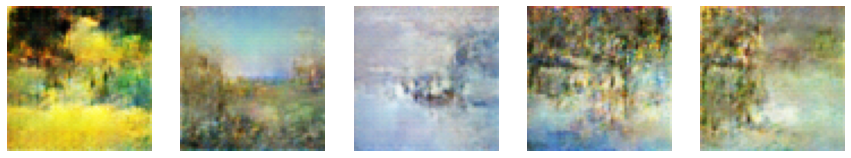


Epoch:  392


LossD: 0.073002 | LossG: 7.130466 | D_x: 0.968917 | DG_z1: 0.027431 | DG_z2: 0.003978

Epoch:  393


LossD: 0.077911 | LossG: 7.467693 | D_x: 0.973835 | DG_z1: 0.030859 | DG_z2: 0.005267

Epoch:  394


LossD: 0.089134 | LossG: 7.332651 | D_x: 0.967725 | DG_z1: 0.030212 | DG_z2: 0.004437

Epoch:  395


LossD: 0.148905 | LossG: 7.899985 | D_x: 0.954093 | DG_z1: 0.049342 | DG_z2: 0.010169

Epoch:  396


LossD: 0.152243 | LossG: 7.795682 | D_x: 0.943138 | DG_z1: 0.051879 | DG_z2: 0.008625

Epoch:  397


LossD: 0.099969 | LossG: 7.445510 | D_x: 0.964187 | DG_z1: 0.037819 | DG_z2: 0.006536

Epoch:  398


LossD: 0.134178 | LossG: 8.031756 | D_x: 0.952962 | DG_z1: 0.044453 | DG_z2: 0.006237

Epoch:  399


LossD: 0.160314 | LossG: 7.577298 | D_x: 0.949224 | DG_z1: 0.044102 | DG_z2: 0.006538

Epoch:  400


LossD: 0.117380 | LossG: 7.462193 | D_x: 0.958432 | DG_z1: 0.044301 | DG_z2: 0.006156

Epoch:  401


LossD: 0.089985 | LossG: 6.916496 | D_x: 0.965600 | DG_z1: 0.034816 | DG_z2: 0.004718


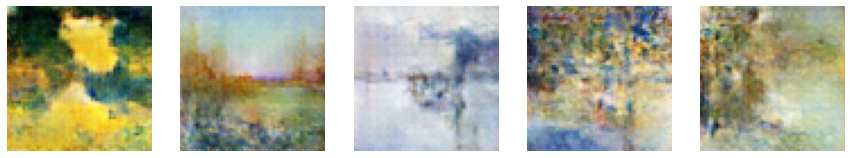


Epoch:  402


LossD: 0.122727 | LossG: 7.597938 | D_x: 0.962068 | DG_z1: 0.040320 | DG_z2: 0.005608

Epoch:  403


LossD: 0.070685 | LossG: 6.661358 | D_x: 0.971865 | DG_z1: 0.030322 | DG_z2: 0.004274

Epoch:  404


LossD: 0.073986 | LossG: 7.073872 | D_x: 0.967375 | DG_z1: 0.029573 | DG_z2: 0.004156

Epoch:  405


LossD: 0.059300 | LossG: 7.038846 | D_x: 0.974396 | DG_z1: 0.024555 | DG_z2: 0.004176

Epoch:  406


LossD: 0.083126 | LossG: 7.179962 | D_x: 0.965150 | DG_z1: 0.026383 | DG_z2: 0.003677

Epoch:  407


LossD: 0.120370 | LossG: 7.895909 | D_x: 0.964010 | DG_z1: 0.043801 | DG_z2: 0.006016

Epoch:  408


LossD: 0.096766 | LossG: 8.128790 | D_x: 0.964698 | DG_z1: 0.036806 | DG_z2: 0.005142

Epoch:  409


LossD: 0.141006 | LossG: 7.173930 | D_x: 0.948173 | DG_z1: 0.046247 | DG_z2: 0.009860

Epoch:  410


LossD: 0.076845 | LossG: 7.231653 | D_x: 0.973315 | DG_z1: 0.032390 | DG_z2: 0.004002

Epoch:  411


LossD: 0.204421 | LossG: 8.476596 | D_x: 0.930963 | DG_z1: 0.063317 | DG_z2: 0.012191


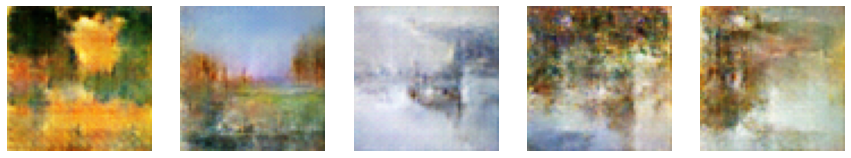


Epoch:  412


LossD: 0.143785 | LossG: 7.826695 | D_x: 0.953342 | DG_z1: 0.052631 | DG_z2: 0.003975

Epoch:  413


LossD: 0.119575 | LossG: 7.649206 | D_x: 0.962459 | DG_z1: 0.036547 | DG_z2: 0.005407

Epoch:  414


LossD: 0.076635 | LossG: 7.342211 | D_x: 0.968540 | DG_z1: 0.030445 | DG_z2: 0.003572

Epoch:  415


LossD: 0.136025 | LossG: 7.689204 | D_x: 0.954126 | DG_z1: 0.045675 | DG_z2: 0.006854

Epoch:  416


LossD: 0.159229 | LossG: 8.582943 | D_x: 0.949416 | DG_z1: 0.053823 | DG_z2: 0.014415

Epoch:  417


LossD: 0.192426 | LossG: 8.432367 | D_x: 0.935454 | DG_z1: 0.059457 | DG_z2: 0.012801

Epoch:  418


LossD: 0.140740 | LossG: 7.591627 | D_x: 0.952152 | DG_z1: 0.048061 | DG_z2: 0.004212

Epoch:  419


LossD: 0.111214 | LossG: 7.495420 | D_x: 0.958200 | DG_z1: 0.039906 | DG_z2: 0.003929

Epoch:  420


LossD: 0.069514 | LossG: 6.883113 | D_x: 0.969888 | DG_z1: 0.029922 | DG_z2: 0.003332

Epoch:  421


LossD: 0.091678 | LossG: 6.839807 | D_x: 0.963876 | DG_z1: 0.034703 | DG_z2: 0.005025


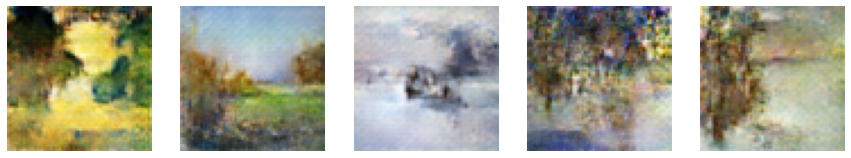


Epoch:  422


LossD: 0.092885 | LossG: 7.422897 | D_x: 0.965238 | DG_z1: 0.033205 | DG_z2: 0.005636

Epoch:  423


LossD: 0.130926 | LossG: 7.637080 | D_x: 0.957641 | DG_z1: 0.041423 | DG_z2: 0.005095

Epoch:  424


LossD: 0.134528 | LossG: 9.133280 | D_x: 0.958898 | DG_z1: 0.050712 | DG_z2: 0.003896

Epoch:  425


LossD: 0.105716 | LossG: 7.671180 | D_x: 0.957635 | DG_z1: 0.033627 | DG_z2: 0.004369

Epoch:  426


LossD: 0.101311 | LossG: 7.425984 | D_x: 0.966461 | DG_z1: 0.035978 | DG_z2: 0.004060

Epoch:  427


LossD: 0.071808 | LossG: 6.740661 | D_x: 0.972411 | DG_z1: 0.029097 | DG_z2: 0.004115

Epoch:  428


LossD: 0.087097 | LossG: 7.344995 | D_x: 0.966828 | DG_z1: 0.033849 | DG_z2: 0.004995

Epoch:  429


LossD: 0.131042 | LossG: 7.209457 | D_x: 0.949943 | DG_z1: 0.034869 | DG_z2: 0.006656

Epoch:  430


LossD: 0.231018 | LossG: 9.049441 | D_x: 0.941130 | DG_z1: 0.062066 | DG_z2: 0.015740

Epoch:  431


LossD: 0.219190 | LossG: 8.750505 | D_x: 0.943075 | DG_z1: 0.066322 | DG_z2: 0.004239


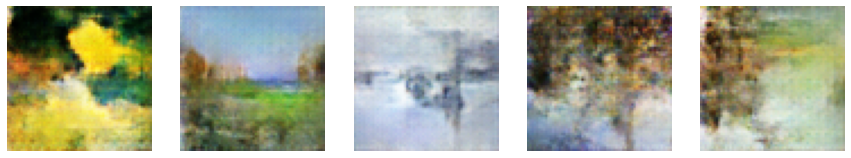


Epoch:  432


LossD: 0.203543 | LossG: 7.828231 | D_x: 0.937521 | DG_z1: 0.058717 | DG_z2: 0.005581

Epoch:  433


LossD: 0.139948 | LossG: 7.095948 | D_x: 0.953881 | DG_z1: 0.053212 | DG_z2: 0.005337

Epoch:  434


LossD: 0.141573 | LossG: 8.034954 | D_x: 0.952170 | DG_z1: 0.046229 | DG_z2: 0.006244

Epoch:  435


LossD: 0.307284 | LossG: 7.959244 | D_x: 0.920204 | DG_z1: 0.076295 | DG_z2: 0.018345

Epoch:  436


LossD: 0.131313 | LossG: 7.467038 | D_x: 0.952631 | DG_z1: 0.050036 | DG_z2: 0.005806

Epoch:  437


LossD: 0.096793 | LossG: 6.993209 | D_x: 0.964834 | DG_z1: 0.036531 | DG_z2: 0.004521

Epoch:  438


LossD: 0.081540 | LossG: 7.258892 | D_x: 0.967416 | DG_z1: 0.031127 | DG_z2: 0.004660

Epoch:  439


LossD: 0.071798 | LossG: 7.482074 | D_x: 0.970165 | DG_z1: 0.030266 | DG_z2: 0.003368

Epoch:  440


LossD: 0.056596 | LossG: 6.840045 | D_x: 0.977275 | DG_z1: 0.024740 | DG_z2: 0.004434

Epoch:  441


LossD: 0.072343 | LossG: 7.141417 | D_x: 0.970921 | DG_z1: 0.025364 | DG_z2: 0.003944


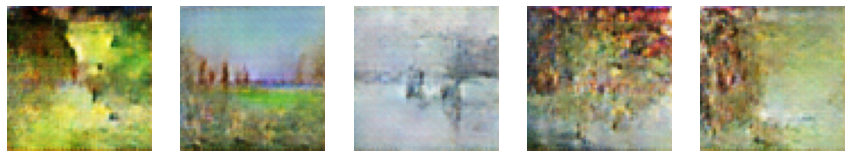


Epoch:  442


LossD: 0.048060 | LossG: 7.558489 | D_x: 0.979592 | DG_z1: 0.021492 | DG_z2: 0.003258

Epoch:  443


LossD: 0.044294 | LossG: 6.706561 | D_x: 0.980108 | DG_z1: 0.020021 | DG_z2: 0.003901

Epoch:  444


LossD: 0.031775 | LossG: 6.535350 | D_x: 0.985579 | DG_z1: 0.015476 | DG_z2: 0.003833

Epoch:  445


LossD: 0.038520 | LossG: 7.051895 | D_x: 0.981715 | DG_z1: 0.016457 | DG_z2: 0.003344

Epoch:  446


LossD: 0.030067 | LossG: 7.302527 | D_x: 0.986873 | DG_z1: 0.014677 | DG_z2: 0.002384

Epoch:  447


LossD: 0.030544 | LossG: 7.668433 | D_x: 0.986013 | DG_z1: 0.012016 | DG_z2: 0.001919

Epoch:  448


LossD: 0.074817 | LossG: 10.894139 | D_x: 0.975081 | DG_z1: 0.027676 | DG_z2: 0.000814

Epoch:  449


LossD: 0.119626 | LossG: 14.859111 | D_x: 0.963267 | DG_z1: 0.033300 | DG_z2: 0.001022

Epoch:  450


LossD: 0.056589 | LossG: 10.024787 | D_x: 0.980492 | DG_z1: 0.023331 | DG_z2: 0.002422

Epoch:  451


LossD: 0.096752 | LossG: 10.419989 | D_x: 0.971078 | DG_z1: 0.027479 | DG_z2: 0.002289


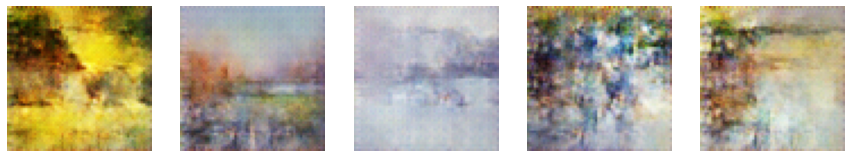


Epoch:  452


LossD: 0.097552 | LossG: 10.725965 | D_x: 0.968483 | DG_z1: 0.029927 | DG_z2: 0.002284

Epoch:  453


LossD: 0.088589 | LossG: 9.065639 | D_x: 0.969251 | DG_z1: 0.027712 | DG_z2: 0.001867

Epoch:  454


LossD: 0.077139 | LossG: 7.556419 | D_x: 0.977609 | DG_z1: 0.025275 | DG_z2: 0.003745

Epoch:  455


LossD: 0.114045 | LossG: 8.918525 | D_x: 0.962594 | DG_z1: 0.036256 | DG_z2: 0.005589

Epoch:  456


LossD: 0.114028 | LossG: 8.025820 | D_x: 0.957514 | DG_z1: 0.029223 | DG_z2: 0.031357

Epoch:  457


LossD: 0.359717 | LossG: 9.692128 | D_x: 0.930634 | DG_z1: 0.086550 | DG_z2: 0.007755

Epoch:  458


LossD: 0.146685 | LossG: 7.741732 | D_x: 0.953843 | DG_z1: 0.043682 | DG_z2: 0.006205

Epoch:  459


LossD: 0.121110 | LossG: 7.489931 | D_x: 0.954012 | DG_z1: 0.036805 | DG_z2: 0.006185

Epoch:  460


LossD: 0.097130 | LossG: 7.335636 | D_x: 0.969206 | DG_z1: 0.042176 | DG_z2: 0.005048

Epoch:  461


LossD: 0.067336 | LossG: 7.232861 | D_x: 0.973956 | DG_z1: 0.023156 | DG_z2: 0.004096


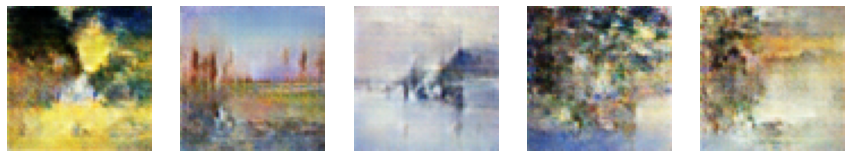


Epoch:  462


LossD: 0.102763 | LossG: 9.162830 | D_x: 0.965433 | DG_z1: 0.036941 | DG_z2: 0.004000

Epoch:  463


LossD: 0.057685 | LossG: 7.263006 | D_x: 0.975821 | DG_z1: 0.025767 | DG_z2: 0.003695

Epoch:  464


LossD: 0.059713 | LossG: 7.187036 | D_x: 0.974471 | DG_z1: 0.022634 | DG_z2: 0.004398

Epoch:  465


LossD: 0.076410 | LossG: 7.791099 | D_x: 0.971230 | DG_z1: 0.030483 | DG_z2: 0.003487

Epoch:  466


LossD: 0.241206 | LossG: 9.011503 | D_x: 0.934718 | DG_z1: 0.065950 | DG_z2: 0.015723

Epoch:  467


LossD: 0.154815 | LossG: 7.985181 | D_x: 0.950373 | DG_z1: 0.046852 | DG_z2: 0.004051

Epoch:  468


LossD: 0.100978 | LossG: 7.379358 | D_x: 0.960852 | DG_z1: 0.040072 | DG_z2: 0.004508

Epoch:  469


LossD: 0.066713 | LossG: 6.848112 | D_x: 0.972155 | DG_z1: 0.026415 | DG_z2: 0.005345

Epoch:  470


LossD: 0.070276 | LossG: 7.115667 | D_x: 0.969444 | DG_z1: 0.029142 | DG_z2: 0.004111

Epoch:  471


LossD: 0.065451 | LossG: 7.386349 | D_x: 0.975512 | DG_z1: 0.024873 | DG_z2: 0.003397


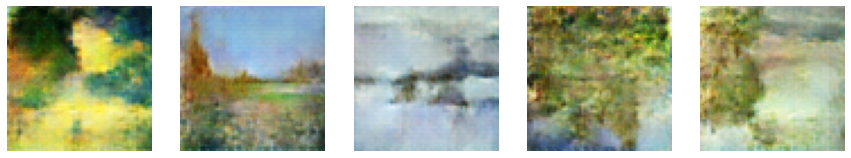


Epoch:  472


LossD: 0.081883 | LossG: 8.297999 | D_x: 0.969412 | DG_z1: 0.031813 | DG_z2: 0.003083

Epoch:  473


LossD: 0.056588 | LossG: 7.519533 | D_x: 0.976737 | DG_z1: 0.021458 | DG_z2: 0.003550

Epoch:  474


LossD: 0.062697 | LossG: 7.168689 | D_x: 0.975888 | DG_z1: 0.024876 | DG_z2: 0.003310

Epoch:  475


LossD: 0.051064 | LossG: 7.225292 | D_x: 0.979470 | DG_z1: 0.021007 | DG_z2: 0.004074

Epoch:  476


LossD: 0.059705 | LossG: 6.860549 | D_x: 0.973176 | DG_z1: 0.020138 | DG_z2: 0.006699

Epoch:  477


LossD: 0.109328 | LossG: 8.539924 | D_x: 0.971815 | DG_z1: 0.036244 | DG_z2: 0.004084

Epoch:  478


LossD: 0.057974 | LossG: 7.004502 | D_x: 0.973278 | DG_z1: 0.022489 | DG_z2: 0.003937

Epoch:  479


LossD: 0.041097 | LossG: 7.417040 | D_x: 0.984166 | DG_z1: 0.020905 | DG_z2: 0.003696

Epoch:  480


LossD: 0.067783 | LossG: 8.002081 | D_x: 0.975115 | DG_z1: 0.024306 | DG_z2: 0.003758

Epoch:  481


LossD: 0.057537 | LossG: 7.499201 | D_x: 0.978313 | DG_z1: 0.021828 | DG_z2: 0.002911


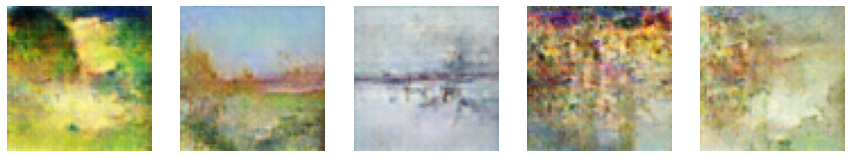


Epoch:  482


LossD: 0.088473 | LossG: 7.281433 | D_x: 0.960983 | DG_z1: 0.018588 | DG_z2: 0.014751

Epoch:  483


LossD: 0.153068 | LossG: 10.966071 | D_x: 0.964195 | DG_z1: 0.053885 | DG_z2: 0.000859

Epoch:  484


LossD: 0.164885 | LossG: 8.700478 | D_x: 0.952326 | DG_z1: 0.047003 | DG_z2: 0.003070

Epoch:  485


LossD: 0.079728 | LossG: 7.077299 | D_x: 0.966948 | DG_z1: 0.032185 | DG_z2: 0.005064

Epoch:  486


LossD: 0.076042 | LossG: 7.454145 | D_x: 0.973843 | DG_z1: 0.024051 | DG_z2: 0.004014

Epoch:  487


LossD: 0.122594 | LossG: 8.390720 | D_x: 0.961725 | DG_z1: 0.042641 | DG_z2: 0.008968

Epoch:  488


LossD: 0.103789 | LossG: 8.250741 | D_x: 0.963396 | DG_z1: 0.032977 | DG_z2: 0.004717

Epoch:  489


LossD: 0.056818 | LossG: 6.997994 | D_x: 0.978423 | DG_z1: 0.027090 | DG_z2: 0.003854

Epoch:  490


LossD: 0.046257 | LossG: 7.098663 | D_x: 0.980394 | DG_z1: 0.018425 | DG_z2: 0.003503

Epoch:  491


LossD: 0.078262 | LossG: 7.505983 | D_x: 0.969478 | DG_z1: 0.024868 | DG_z2: 0.004856


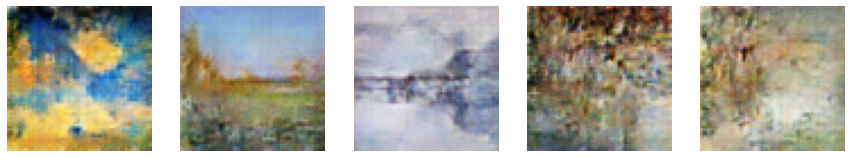


Epoch:  492


LossD: 0.059916 | LossG: 7.698745 | D_x: 0.974724 | DG_z1: 0.024646 | DG_z2: 0.003051

Epoch:  493


LossD: 0.063808 | LossG: 7.636648 | D_x: 0.976494 | DG_z1: 0.026516 | DG_z2: 0.003054

Epoch:  494


LossD: 0.030731 | LossG: 7.375195 | D_x: 0.986710 | DG_z1: 0.014942 | DG_z2: 0.002913

Epoch:  495


LossD: 0.054709 | LossG: 8.613977 | D_x: 0.976610 | DG_z1: 0.019909 | DG_z2: 0.004078

Epoch:  496


LossD: 0.066700 | LossG: 8.061951 | D_x: 0.976090 | DG_z1: 0.024627 | DG_z2: 0.003720

Epoch:  497


LossD: 0.070500 | LossG: 7.817155 | D_x: 0.974822 | DG_z1: 0.026560 | DG_z2: 0.003290

Epoch:  498


LossD: 0.042050 | LossG: 7.360592 | D_x: 0.980159 | DG_z1: 0.018424 | DG_z2: 0.003240

Epoch:  499


LossD: 0.041425 | LossG: 7.521269 | D_x: 0.983218 | DG_z1: 0.018222 | DG_z2: 0.003347

Epoch:  500


LossD: 0.035312 | LossG: 7.581825 | D_x: 0.984329 | DG_z1: 0.014884 | DG_z2: 0.002374


In [ ]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

num_epochs= 500

print("Starting Training Loop...")

for epoch in range(num_epochs):

    print("\nEpoch: ", epoch+1)

    batch_bar = tqdm(total=len(dataloader), dynamic_ncols=True, leave=False, position=0, desc='Train') 
    epoch_stats = [0, 0, 0, 0, 0]

    for i, data in enumerate(dataloader, 0):

        errD, D_x, D_G_z1, fake = discriminator_train_step(model, data)
        errG, D_G_z2 = generator_train_step(model, data, fake)

        batch_bar.set_postfix(LossD="{:.06f}".format(errD),
                              LossG="{:.06f}".format(errG),
                              D_x="{:.06f}".format(D_x),
                              DG_z1="{:.06f}".format(D_G_z1),
                              DG_z2="{:.06f}".format(D_G_z2))
        
        epoch_stats[0] += errD
        epoch_stats[1] += errG
        epoch_stats[2] += D_x
        epoch_stats[3] += D_G_z1
        epoch_stats[4] += D_G_z2

        batch_bar.update()

        # Save Losses for plotting later
        G_losses.append(errG)
        D_losses.append(errD)

        # Check how the generator is doing by saving G's output on fixed_noise
    batch_bar.close()

    print("LossD: {:.06f} | LossG: {:.06f} | D_x: {:.06f} | DG_z1: {:.06f} | DG_z2: {:.06f}"\
         .format(epoch_stats[0]/len(dataloader), epoch_stats[1]/len(dataloader), epoch_stats[2]/len(dataloader),
                 epoch_stats[3]/len(dataloader), epoch_stats[4]/len(dataloader)))

    if epoch%10 == 0:
        with torch.no_grad():
            fake = model.generator(fixed_noise).detach().cpu()
        show_imgs(fake)
    

In [ ]:
# Can you use HW2P2 Data and generate new faces?